In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from datetime import datetime
import missingno as msno
import plotly.express as px

import cartopy.crs as ccrs
import cartopy.feature as cfeature

import warnings
warnings.filterwarnings('ignore')

In [45]:
df = pd.read_csv("Significant_Earthquakes.csv")

In [46]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110355 entries, 0 to 110354
Data columns (total 23 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   Unnamed: 0       110355 non-null  int64  
 1   time             110355 non-null  object 
 2   latitude         110355 non-null  float64
 3   longitude        110355 non-null  float64
 4   depth            110070 non-null  float64
 5   mag              110355 non-null  float64
 6   magType          110355 non-null  object 
 7   nst              39714 non-null   float64
 8   gap              50005 non-null   float64
 9   dmin             30061 non-null   float64
 10  rms              81608 non-null   float64
 11  net              110355 non-null  object 
 12  id               110355 non-null  object 
 13  updated          110355 non-null  object 
 14  place            109464 non-null  object 
 15  type             110355 non-null  object 
 16  horizontalError  28681 non-null   floa

In [47]:
df.head()

,Unnamed: 0,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,...,updated,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource
0,0,1900-10-09T12:25:00.000Z,57.09,-153.48,NaN,7.86,mw,NaN,NaN,NaN,...,2022-05-09T14:44:17.838Z,"16 km SW of Old Harbor, Alaska",earthquake,NaN,NaN,NaN,NaN,reviewed,ushis,pt
1,1,1901-03-03T07:45:00.000Z,36.00,-120.50,NaN,6.40,ms,NaN,NaN,NaN,...,2018-06-04T20:43:44.000Z,"12 km NNW of Parkfield, California",earthquake,NaN,NaN,NaN,NaN,reviewed,ushis,ell
2,2,1901-07-26T22:20:00.000Z,40.80,-115.70,NaN,5.00,fa,NaN,NaN,NaN,...,2018-06-04T20:43:44.000Z,"6 km SE of Elko, Nevada",earthquake,NaN,NaN,NaN,NaN,reviewed,ushis,sjg
3,3,1901-12-30T22:34:00.000Z,52.00,-160.00,NaN,7.00,ms,NaN,NaN,NaN,...,2018-06-04T20:43:44.000Z,south of Alaska,earthquake,NaN,NaN,NaN,NaN,reviewed,ushis,abe
4,4,1902-01-01T05:20:30.000Z,52.38,-167.45,NaN,7.00,ms,NaN,NaN,NaN,...,2018-06-04T20:43:44.000Z,"113 km ESE of Nikolski, Alaska",earthquake,NaN,NaN,NaN,NaN,reviewed,ushis,abe


In [48]:
df.tail()

,Unnamed: 0,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,...,updated,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource
110350,110350,2025-09-27T08:10:52.283Z,-13.7832,166.6756,67.813,5.5,mww,142.0,50.0,7.106,...,2025-10-22T07:00:08.285Z,"95 km W of Sola, Vanuatu",earthquake,8.25,5.451,0.071,19.0,reviewed,us,us
110351,110351,2025-09-27T07:25:00.704Z,49.1839,157.9858,10.000,5.1,mb,149.0,129.0,3.867,...,2025-10-22T06:42:04.040Z,"212 km SE of Severo-Kuril’sk, Russia",earthquake,10.10,1.878,0.033,303.0,reviewed,us,us
110352,110352,2025-09-26T21:49:58.783Z,34.9225,104.5992,10.000,5.2,mww,127.0,20.0,1.268,...,2025-10-25T05:22:23.928Z,"17 km NW of Hualin, China",earthquake,6.38,1.801,0.058,29.0,reviewed,us,us
110353,110353,2025-09-26T06:45:28.067Z,43.4524,-127.3203,10.000,5.9,mww,85.0,167.0,2.395,...,2025-10-24T06:55:37.836Z,"239 km W of Bandon, Oregon",earthquake,8.60,1.886,0.037,69.0,reviewed,us,us
110354,110354,2025-09-26T06:32:33.959Z,-15.0755,-173.5580,10.000,5.1,mb,37.0,101.0,2.074,...,2025-10-19T05:29:52.040Z,"100 km NNE of Hihifo, Tonga",earthquake,12.00,1.488,0.041,188.0,reviewed,us,us


In [49]:
print("Number of duplicates: " + str(df.duplicated().sum()))

Number of duplicates: 0


In [50]:
df.iloc[:, :].describe().T.sort_values(by='std' , ascending = False)\
                     .style.background_gradient(cmap='GnBu')\
                     .bar(subset=["max"], color='#BB0000')\
                     .bar(subset=["mean",], color='green')

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,110355.000000,55177.000000,31856.888815,0.000000,27588.500000,55177.000000,82765.500000,110354.000000
longitude,110355.000000,41.470571,121.942519,-179.997000,-71.980000,100.471000,143.184200,180.000000
nst,39714.000000,140.853754,116.837908,0.000000,63.000000,103.000000,179.000000,929.000000
depth,110070.000000,61.326147,107.624666,-4.000000,10.000000,33.000000,51.000000,700.000000
magNst,50330.000000,64.642758,101.705825,0.000000,13.000000,30.000000,69.000000,1144.000000
gap,50005.000000,65.624950,39.215842,6.500000,37.000000,57.000000,84.700000,360.000000
latitude,110355.000000,3.707473,30.440922,-77.080000,-17.849000,-0.675000,29.896000,87.386000
depthError,60640.000000,7.270212,10.124054,-1.000000,1.900000,4.600000,8.100000,1091.900000
dmin,30061.000000,4.193231,5.180934,0.000000,1.296000,2.512000,4.910000,50.901000
horizontalError,28681.000000,7.869001,3.902422,0.000000,6.200000,7.770000,9.380000,99.000000


In [51]:
for column in df.columns:
    num_distinct_values = len(df[column].unique())
    print(f"{column}: {num_distinct_values} distinct values")


Unnamed: 0: 110355 distinct values
time: 104577 distinct values
latitude: 76324 distinct values
longitude: 83566 distinct values
depth: 13181 distinct values
mag: 314 distinct values
magType: 26 distinct values
nst: 735 distinct values
gap: 1854 distinct values
dmin: 9549 distinct values
rms: 271 distinct values
net: 21 distinct values
id: 101062 distinct values
updated: 101640 distinct values
place: 62697 distinct values
type: 7 distinct values
horizontalError: 1452 distinct values
depthError: 4182 distinct values
magError: 338 distinct values
magNst: 722 distinct values
status: 2 distinct values
locationSource: 88 distinct values
magSource: 91 distinct values


In [52]:
# Lets check seismic events types recorded in dataset (other than 'earthquake') ?

print(f"The nunber of records for each datapoint type:\n")

print(df['type'].value_counts())

The nunber of records for each datapoint type:

type
earthquake           109863
nuclear explosion       424
volcanic eruption        54
explosion                10
landslide                 2
rock burst                1
mine collapse             1
Name: count, dtype: int64


In [53]:
# Keep only rows where feature 'type' value is 'earthquake'

df = df[df['type'] == 'earthquake']

In [54]:
# Print column names
print(df.columns.tolist())

['Unnamed: 0', 'time', 'latitude', 'longitude', 'depth', 'mag', 'magType', 'nst', 'gap', 'dmin', 'rms', 'net', 'id', 'updated', 'place', 'type', 'horizontalError', 'depthError', 'magError', 'magNst', 'status', 'locationSource', 'magSource']


In [55]:
# List of U.S. states
us_states = {
    'Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California', 'Colorado', 'Connecticut',
    'Delaware', 'Florida', 'Georgia', 'Hawaii', 'Idaho', 'Illinois', 'Indiana', 'Iowa',
    'Kansas', 'Kentucky', 'Louisiana', 'Maine', 'Maryland', 'Massachusetts', 'Michigan',
    'Minnesota', 'Mississippi', 'Missouri', 'Montana', 'Nebraska', 'Nevada', 'New Hampshire',
    'New Jersey', 'New Mexico', 'New York', 'North Carolina', 'North Dakota', 'Ohio',
    'Oklahoma', 'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina', 'South Dakota',
    'Tennessee', 'Texas', 'Utah', 'Vermont', 'Virginia', 'Washington', 'West Virginia',
    'Wisconsin', 'Wyoming'
}

# Robust extraction function
def extract_region(place):
    try:
        place_str = str(place)
        if ',' in place_str:
            return place_str.split(',')[-1].strip()
        else:
            return place_str.split()[-1].strip()
    except Exception:
        return None  # or use np.nan if preferred

def map_country(region):
    return 'United States' if region in us_states else region

# Apply to DataFrame
df['region'] = df['place'].apply(extract_region)
df['Country'] = df['region'].apply(map_country)



# Display result
print(df[['place', 'region', 'Country']].head())
print(df[['place', 'region', 'Country']].tail())

                                place      region        Country
0      16 km SW of Old Harbor, Alaska      Alaska  United States
1  12 km NNW of Parkfield, California  California  United States
2             6 km SE of Elko, Nevada      Nevada  United States
3                     south of Alaska      Alaska  United States
4      113 km ESE of Nikolski, Alaska      Alaska  United States
                                       place   region        Country
110350              95 km W of Sola, Vanuatu  Vanuatu        Vanuatu
110351  212 km SE of Severo-Kuril’sk, Russia   Russia         Russia
110352             17 km NW of Hualin, China    China          China
110353            239 km W of Bandon, Oregon   Oregon  United States
110354           100 km NNE of Hihifo, Tonga    Tonga          Tonga


In [56]:
# List unique values in 'region'
unique_regions = df['region'].dropna().unique().tolist()
print("Unique regions:")
print(unique_regions)

# List unique values in 'Country'
unique_countries = df['Country'].dropna().unique().tolist()
print("\nUnique countries:")
print(unique_countries)

Unique regions:
['Alaska', 'California', 'Nevada', 'Utah', 'Missouri', 'Maine', 'Washington', 'Bulgaria', 'Russia', 'China', 'Costa Rica', 'Chile', 'Panama', 'Greece', 'Papua New Guinea', 'Iran', 'Vanuatu', 'Myanmar', 'Caledonia', 'Tonga', 'Switzerland', 'Peru', 'Albania', 'India', 'North Macedonia', 'Turkey', 'Japan region', 'Mexico', 'Islands', 'Solomon Islands', 'region', 'Japan', 'Montenegro', 'Mongolia', 'Philippines', 'Canada', 'Italy', 'Timor Leste', 'Georgia', 'Jamaica', 'Sea', 'Slovakia', 'Croatia', 'Anguilla', 'Australia', 'Taiwan', 'Svalbard and Jan Mayen', 'Earthquake', 'Nicaragua', 'Indonesia', 'Ridge', 'Ethiopia', 'Russia region', 'Uzbekistan', 'Azerbaijan', 'Libya', 'Armenia', 'Okhotsk', 'Bosnia and Herzegovina', 'Pakistan', 'Colombia', 'Ecuador', 'Serbia', 'Guatemala', 'Kyrgyzstan', 'Tajikistan', 'Algeria', 'Hawaii', 'Svalbard', 'Ocean', 'Yemen', 'Portugal', 'Zemlya', 'Illinois', 'Montana', 'France', 'Afghanistan', 'New Caledonia', 'America', 'Indiana', 'Guam', 'Trinida

In [57]:
df['time'] = pd.to_datetime(df['time'])
df['month'] = df['time'].dt.month
df['year'] = df['time'].dt.year

In [58]:
# Define function to classify magnitude
def classify_magnitude(mag):
    try:
        if mag >= 8.0:
            return "Catastrophic event (8+)"
        elif mag >= 7.0:
            return "Major earthquake (7-8)"
        elif mag >= 6.1:
            return "Strong quake (6.1-7)"
        elif mag >= 5.5:
            return "Moderate quake (5.5-6.1)"
        elif mag >= 2.5:
            return "Minor tremor (2.5-5.5)"
        # else:            return "Below threshold 2.5"
    except:
        return "Unknown"

# Apply classification
df['Magnitude'] = df['mag'].apply(classify_magnitude)

# Define ordered categories
magnitude_order = [
    # "Below threshold 2.5",
    "Minor tremor (2.5-5.5)",
    "Moderate quake (5.5-6.1)",
    "Strong quake (6.1-7)",
    "Major earthquake (7-8)",
    "Catastrophic event (8+)"
    # "Unknown"
]

In [59]:
# Replace underscores with spaces and title case column names
df.columns = df.columns.str.replace('_', ' ').str.title()

In [60]:
# Head of the dataframe with updated feature names
df.head()

,Unnamed: 0,Time,Latitude,Longitude,Depth,Mag,Magtype,Nst,Gap,Dmin,...,Magerror,Magnst,Status,Locationsource,Magsource,Region,Country,Month,Year,Magnitude
0,0,1900-10-09 12:25:00+00:00,57.09,-153.48,NaN,7.86,mw,NaN,NaN,NaN,...,NaN,NaN,reviewed,ushis,pt,Alaska,United States,10,1900,Major earthquake (7-8)
1,1,1901-03-03 07:45:00+00:00,36.00,-120.50,NaN,6.40,ms,NaN,NaN,NaN,...,NaN,NaN,reviewed,ushis,ell,California,United States,3,1901,Strong quake (6.1-7)
2,2,1901-07-26 22:20:00+00:00,40.80,-115.70,NaN,5.00,fa,NaN,NaN,NaN,...,NaN,NaN,reviewed,ushis,sjg,Nevada,United States,7,1901,Minor tremor (2.5-5.5)
3,3,1901-12-30 22:34:00+00:00,52.00,-160.00,NaN,7.00,ms,NaN,NaN,NaN,...,NaN,NaN,reviewed,ushis,abe,Alaska,United States,12,1901,Major earthquake (7-8)
4,4,1902-01-01 05:20:30+00:00,52.38,-167.45,NaN,7.00,ms,NaN,NaN,NaN,...,NaN,NaN,reviewed,ushis,abe,Alaska,United States,1,1902,Major earthquake (7-8)


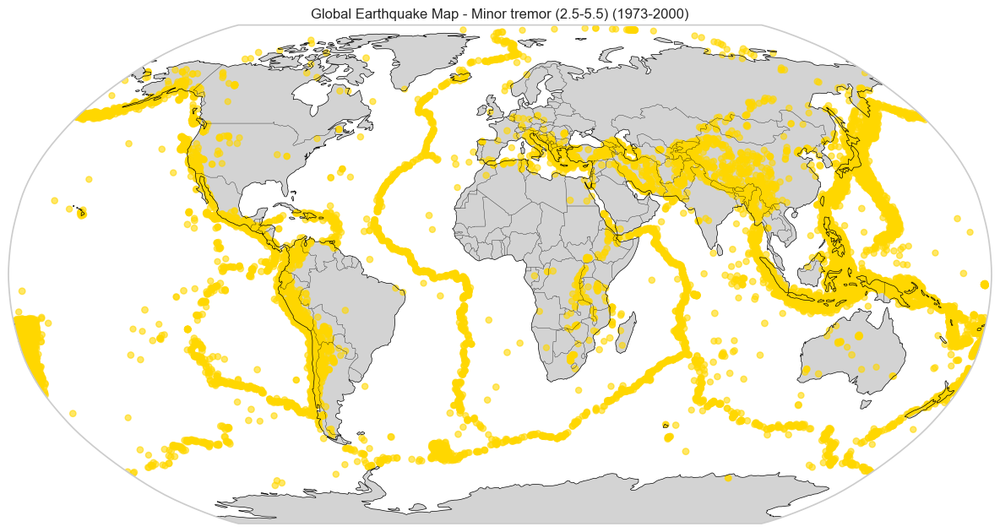

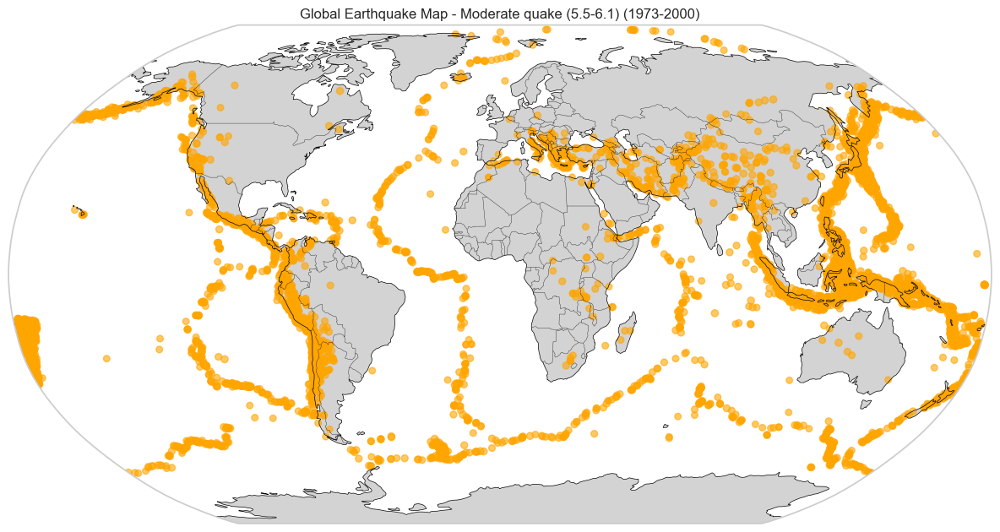

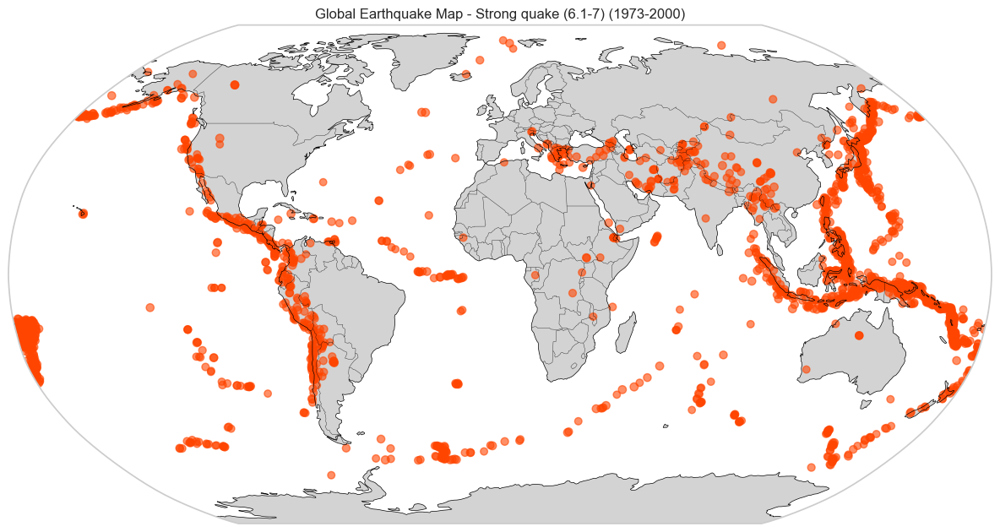

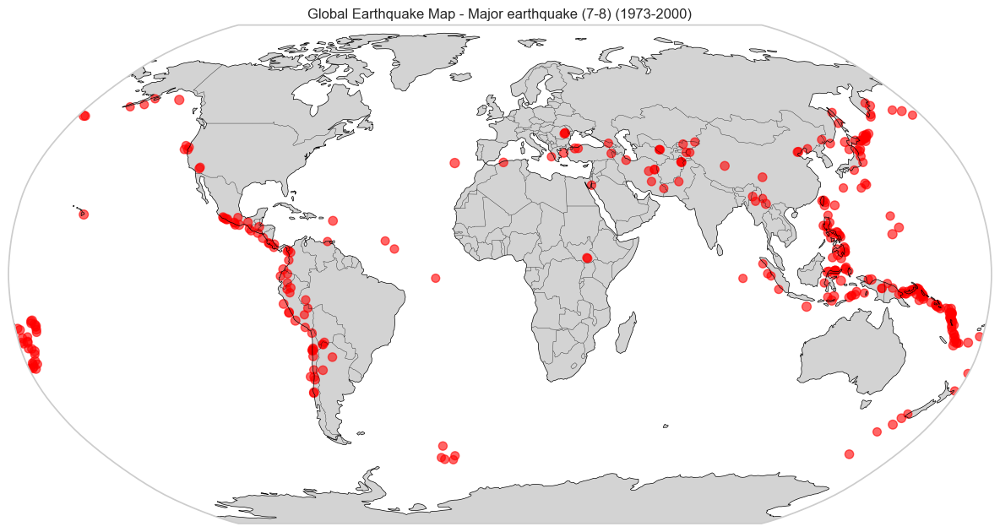

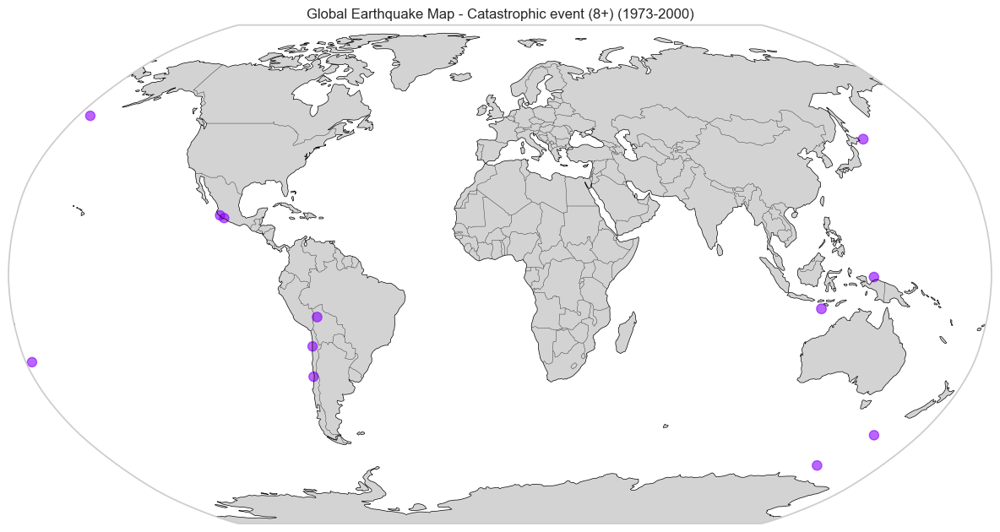

In [61]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Apply classification
df['Magnitude'] = df['Mag'].apply(classify_magnitude)

# Define ordered categories
magnitude_order = [
    "Minor tremor (2.5-5.5)",
    "Moderate quake (5.5-6.1)",
    "Strong quake (6.1-7)",
    "Major earthquake (7-8)",
    "Catastrophic event (8+)"
]

# Define heat-inspired colors
magnitude_colors = {
    "Minor tremor (2.5-5.5)": "#FFD700",   # yellow
    "Moderate quake (5.5-6.1)": "#FFA500", # orange
    "Strong quake (6.1-7)": "#FF4500",     # red-orange
    "Major earthquake (7-8)": "#FF0000",   # red
    "Catastrophic event (8+)": "#8B00FF"   # violet
}

# Filter data for global view (1973–2000)
global_df = df[(df['Year'] >= 1973) & (df['Year'] < 2000)]

# Loop through each magnitude category
for mag_group in magnitude_order:
    group_df = global_df[global_df['Magnitude'] == mag_group]
    
    if group_df.empty:
        continue  # Skip if no data for this group

    plt.figure(figsize=(12, 7))
    
    # Set up a Robinson projection
    ax = plt.axes(projection=ccrs.Robinson())
    ax.set_global()
    ax.coastlines(linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, linewidth=0.25)
    ax.add_feature(cfeature.LAND, facecolor='lightgray')

    # Plot earthquake data
    ax.scatter(
        group_df["Longitude"],
        group_df["Latitude"],
        transform=ccrs.PlateCarree(),
        s=group_df["Mag"].values**2,
        c=magnitude_colors[mag_group],
        alpha=0.6,
        label=mag_group
    )

    # Add title
    plt.title(f'Global Earthquake Map - {mag_group} (1973-2000)')
    plt.tight_layout()
    plt.show()

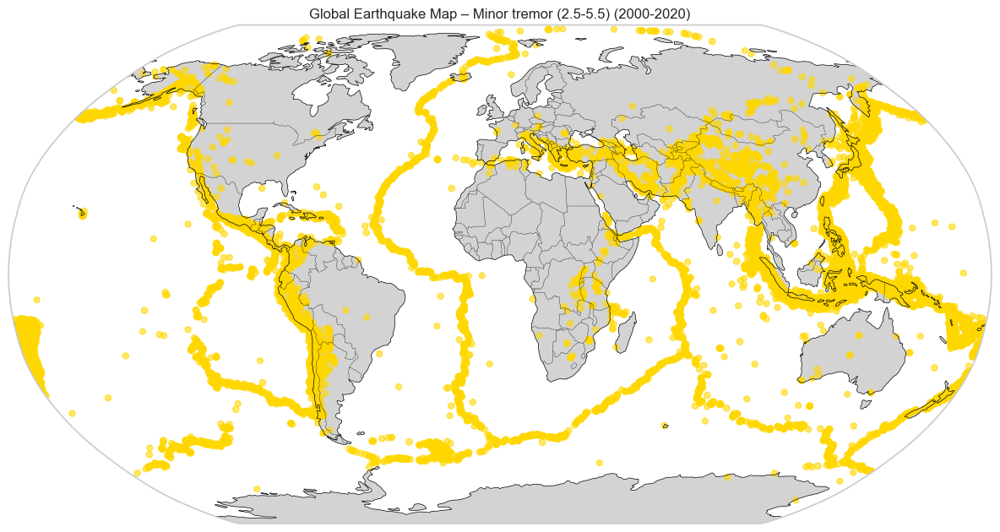

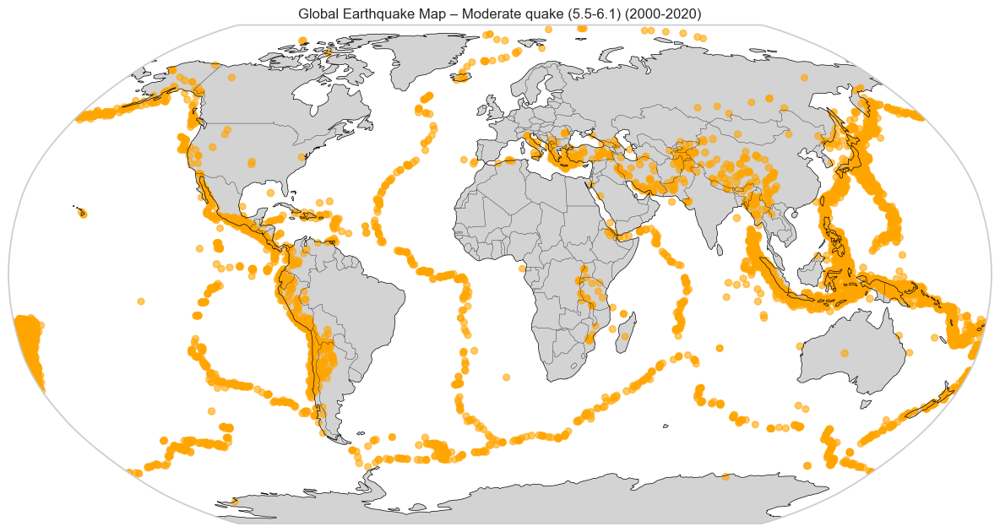

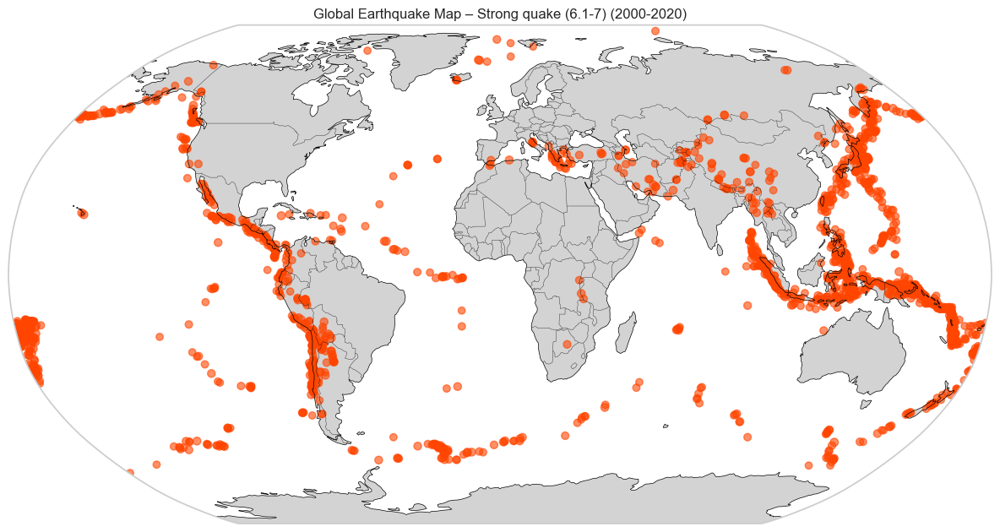

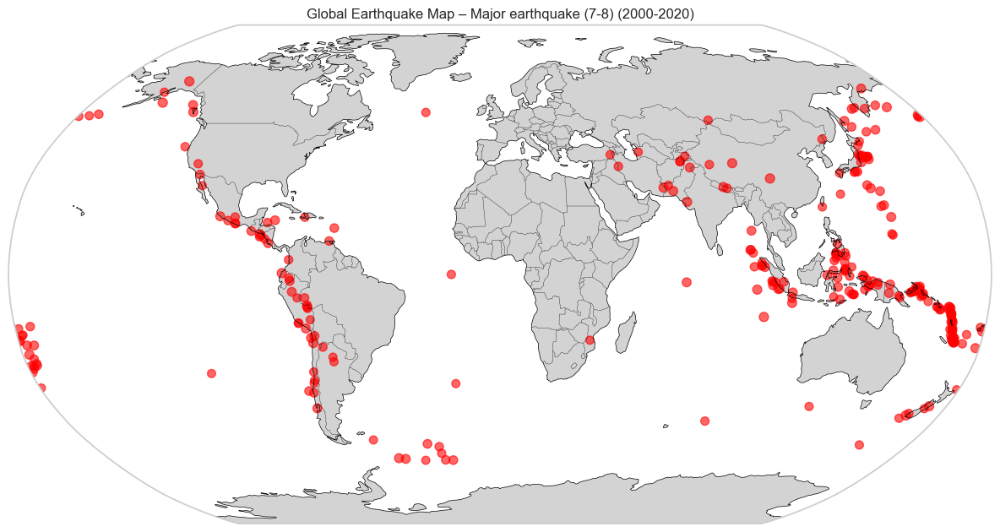

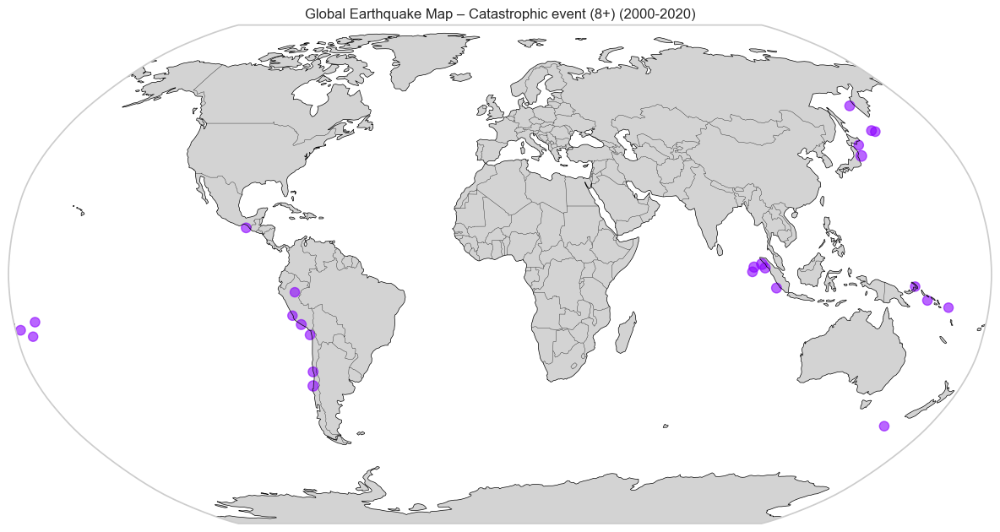

In [62]:
# Filter data for global view (2000 - 2020)
global_df = df[(df['Year'] >= 2000) & (df['Year'] < 2020)]

# Loop through each magnitude category
for mag_group in magnitude_order:
    group_df = global_df[global_df['Magnitude'] == mag_group]
    
    if group_df.empty:
        continue  # Skip if no data for this group

    plt.figure(figsize=(12, 7))
    
    # Set up a Robinson projection
    ax = plt.axes(projection=ccrs.Robinson())
    ax.set_global()
    ax.coastlines(linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, linewidth=0.25)
    ax.add_feature(cfeature.LAND, facecolor='lightgray')

    # Plot earthquake data
    ax.scatter(
        group_df["Longitude"],
        group_df["Latitude"],
        transform=ccrs.PlateCarree(),
        s=group_df["Mag"].values**2,
        c=magnitude_colors[mag_group],
        alpha=0.6,
        label=mag_group
    )

    # Add title
    plt.title(f'Global Earthquake Map – {mag_group} (2000-2020)')
    plt.tight_layout()
    plt.show()

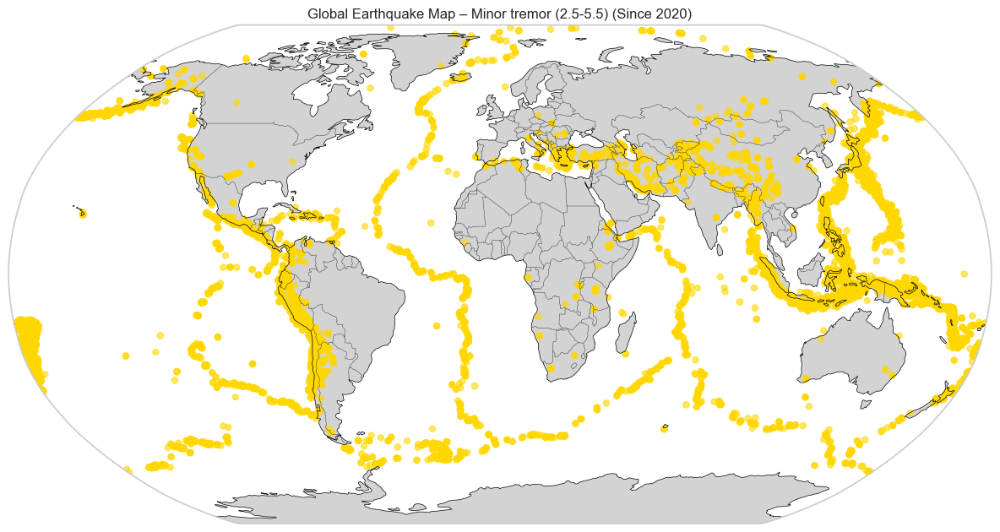

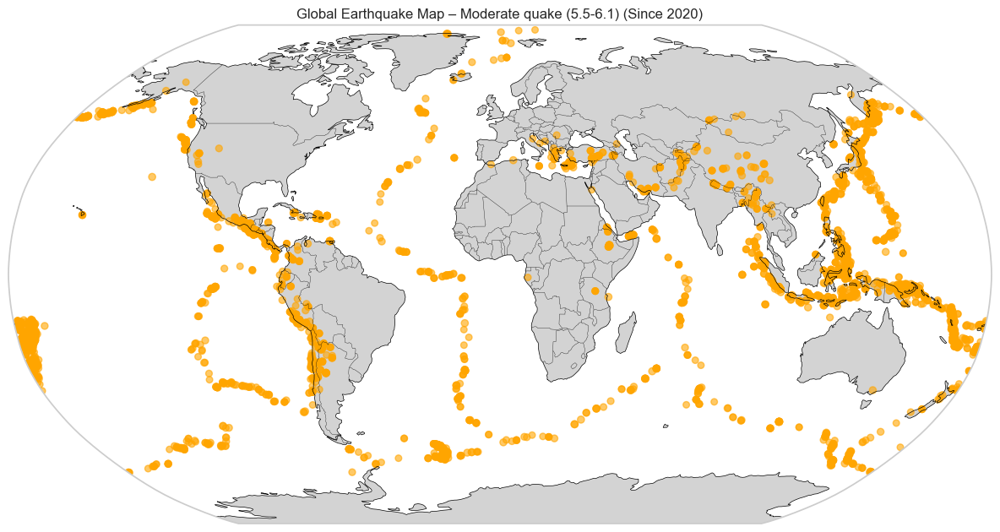

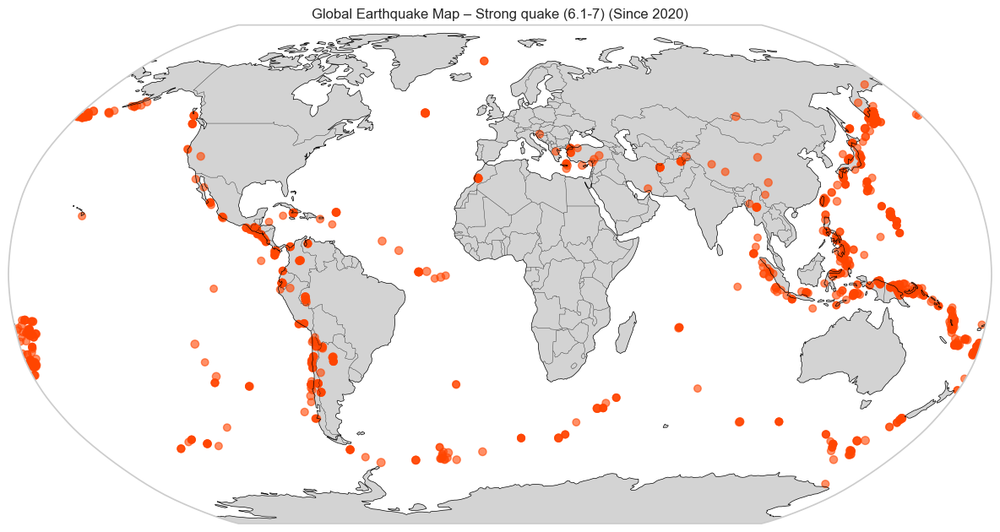

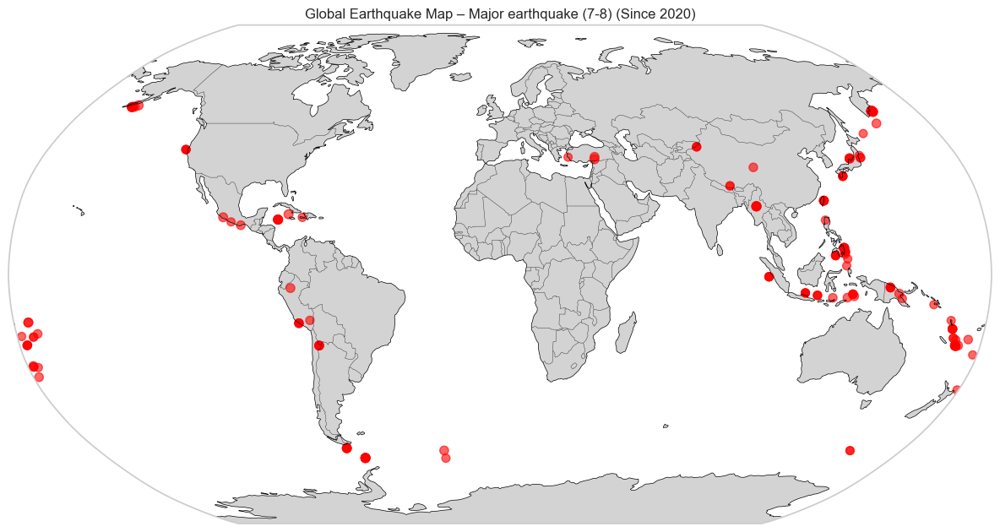

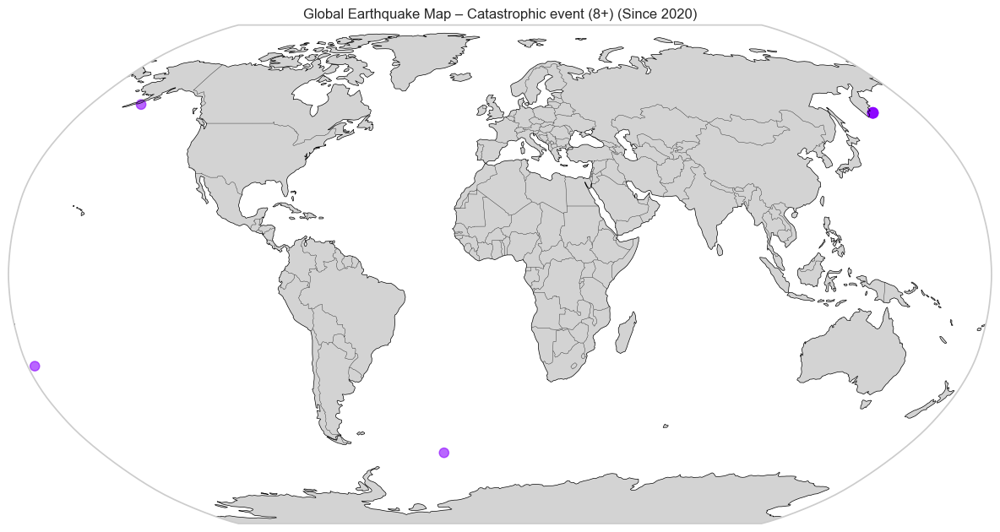

In [63]:
# Filter data scope for global views
global_df = df[df['Year'] >= 2020]

# Loop through each magnitude category
for mag_group in magnitude_order:
    group_df = global_df[global_df['Magnitude'] == mag_group]
    
    if group_df.empty:
        continue  # Skip if no data for this group

    plt.figure(figsize=(12, 7))
    
    # Set up a Robinson projection
    ax = plt.axes(projection=ccrs.Robinson())
    ax.set_global()
    ax.coastlines(linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, linewidth=0.25)
    ax.add_feature(cfeature.LAND, facecolor='lightgray')

    # Plot earthquake data
    ax.scatter(
        group_df["Longitude"],
        group_df["Latitude"],
        transform=ccrs.PlateCarree(),
        s=group_df["Mag"].values**2,
        c=magnitude_colors[mag_group],
        alpha=0.6,
        label=mag_group
    )

    # Add title
    plt.title(f'Global Earthquake Map – {mag_group} (Since 2020)')
    plt.tight_layout()
    plt.show()

In [64]:
# Filter for selected countries
country_list = ['United States', 'Chile', 'Japan', 'Indonesia']
filtered_df = df[df['Country'].isin(country_list)]


# Define strong earthquake threshold
strong_quake_df = df[
    (df['Country'].isin(country_list)) &
    (df['Mag'] >= 6.0)
]

# Group and count by Country and Year
quake_counts = strong_quake_df.groupby(['Country', 'Year']).size().unstack(fill_value=0)

# Display the result

# Optional: Expand display to show full DataFrame
pd.set_option('display.max_rows', None)
pd.set_option('display.width', None)

# Now print the transposed table
print(quake_counts.T)

Country  Chile  Indonesia  Japan  United States
Year                                           
1900         0          0      0              1
1901         0          0      0              2
1902         0          0      0              2
1903         0          0      0              3
1904         1          0      0              1
1905         0          0      2              9
1906         6          4      8              8
1907         2          7      2              4
1908         0          1      1              4
1909         1          3      7              5
1910         1          1      2              6
1911         1          0      4              6
1912         0          2      3             10
1913         1          6     10              2
1914         2          6      4              4
1915         0          5     11              6
1916         2          7      9              5
1917         1          6      6              7
1918         3          6      3        

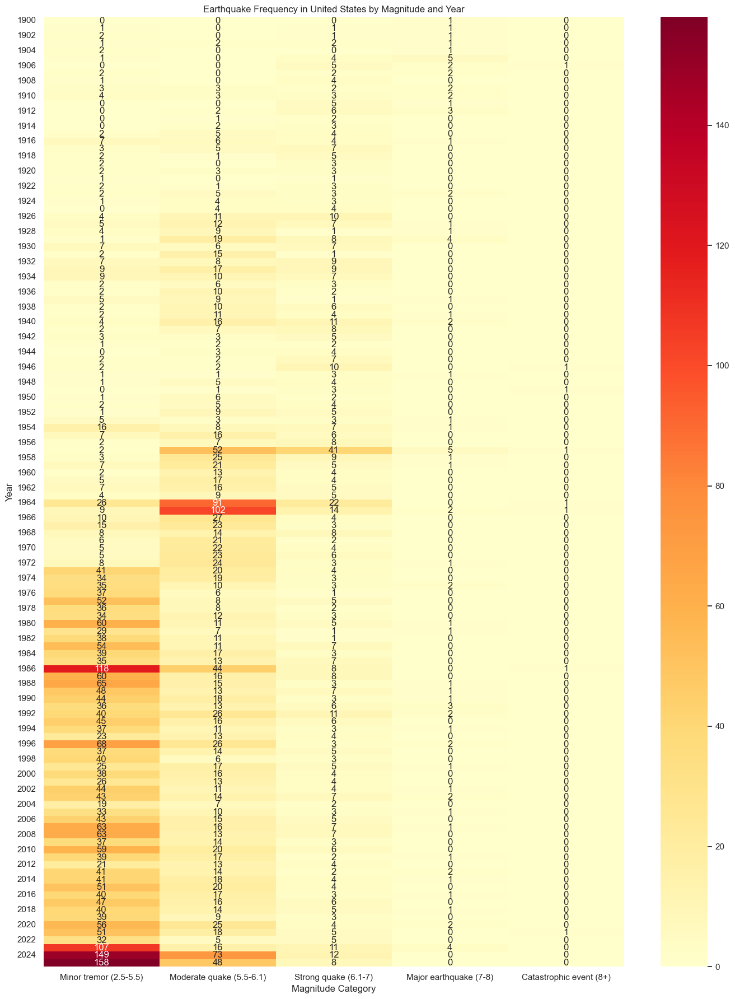

In [65]:
# Create heatmaps for first country in the list (US) - all data

country = country_list[0]
country_df = filtered_df[filtered_df['Country'] == country]
    
# Create pivot table: rows = Year, columns = Magnitude, values = count
heatmap_data = country_df.pivot_table(
        index='Year',
        columns='Magnitude',
        aggfunc='size',
        fill_value=0
)

# Reindex columns to match magnitude_order
heatmap_data = heatmap_data.reindex(columns=magnitude_order).fillna(0).astype(int)

# Remove column total labeled 'All' if it exists
heatmap_data = heatmap_data.loc[:, heatmap_data.columns != 'All']

# Plot heatmap
plt.figure(figsize=(14, 18))
sns.heatmap(heatmap_data, annot=True, fmt='d', cmap='YlOrRd')
    
plt.title(f"Earthquake Frequency in {country} by Magnitude and Year")
plt.ylabel("Year")
plt.xlabel("Magnitude Category")
plt.tight_layout()
plt.show()

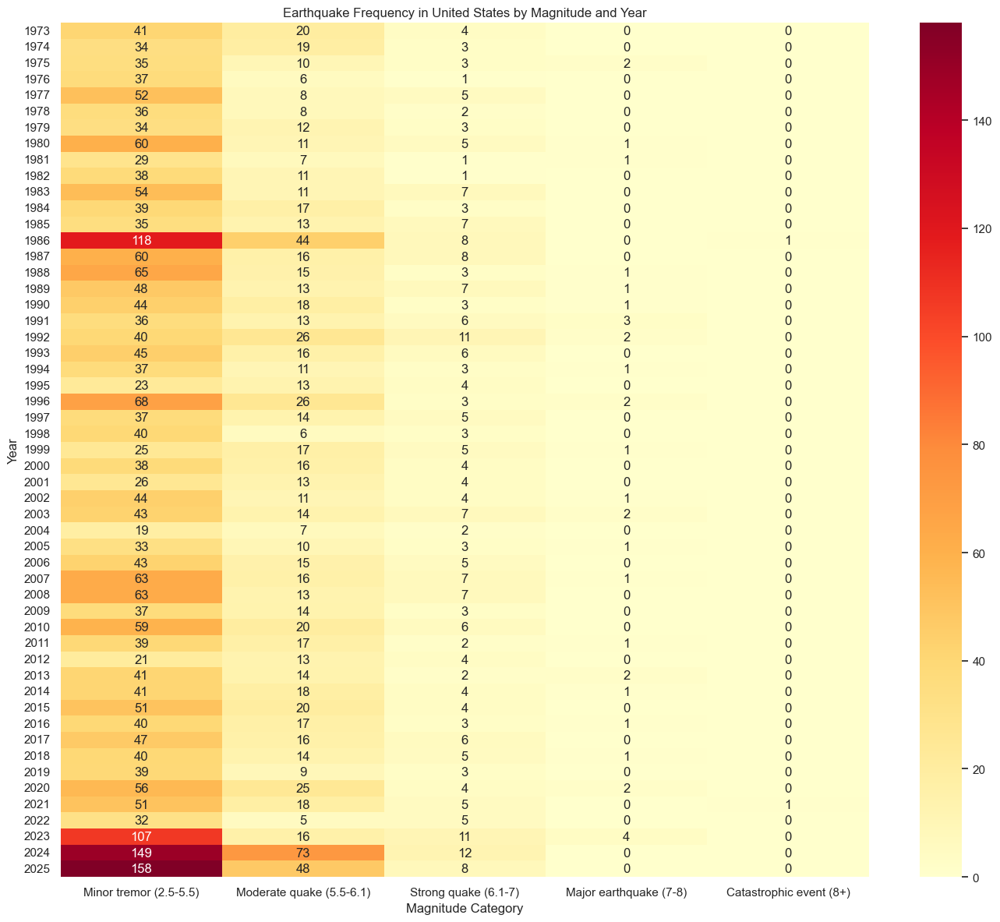

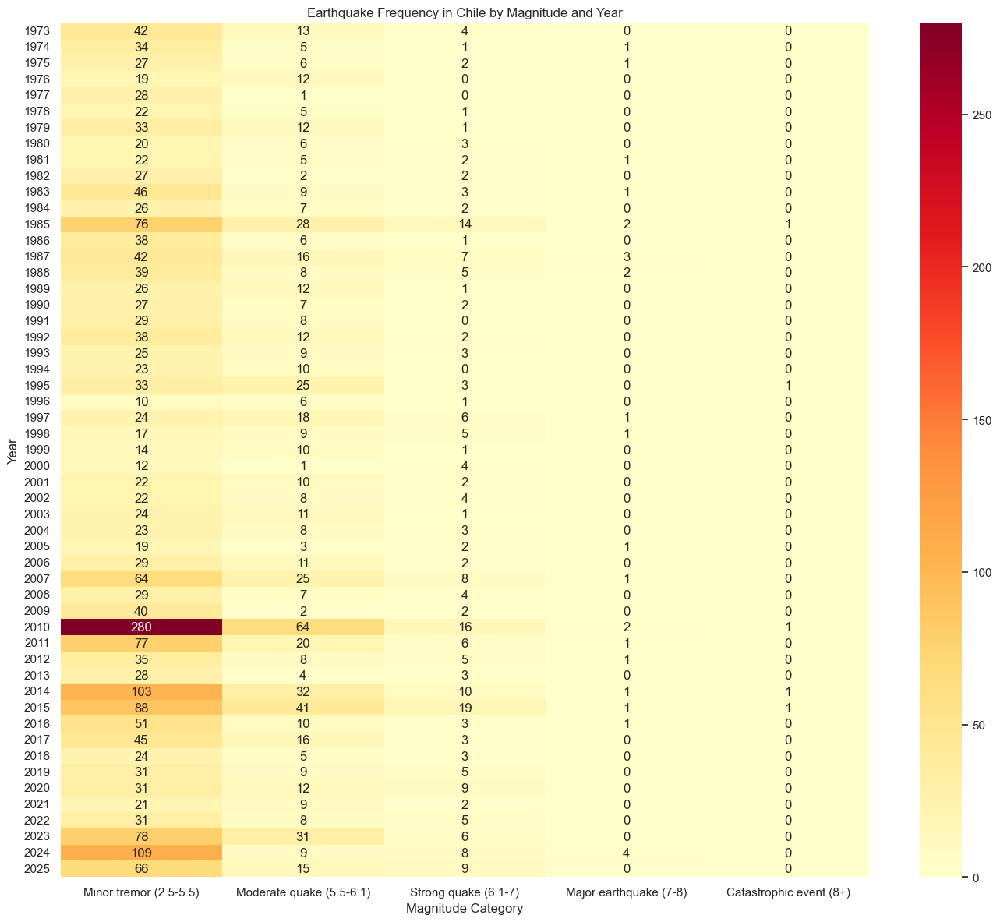

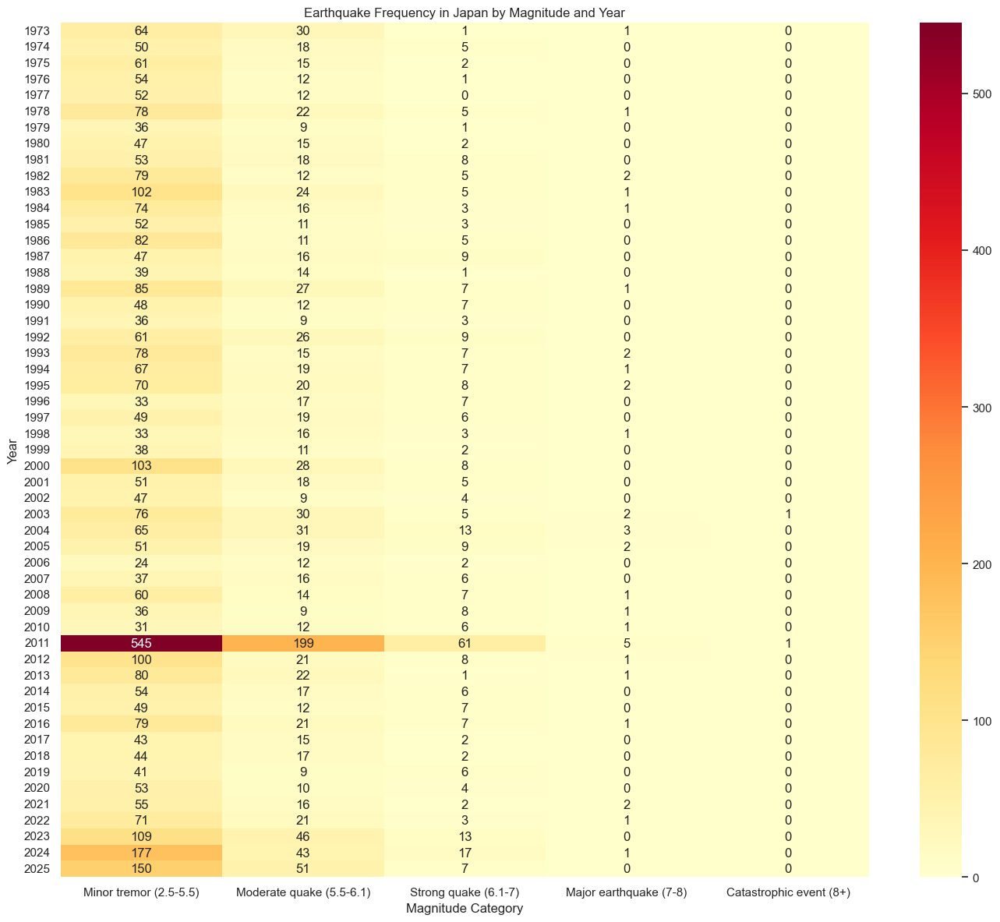

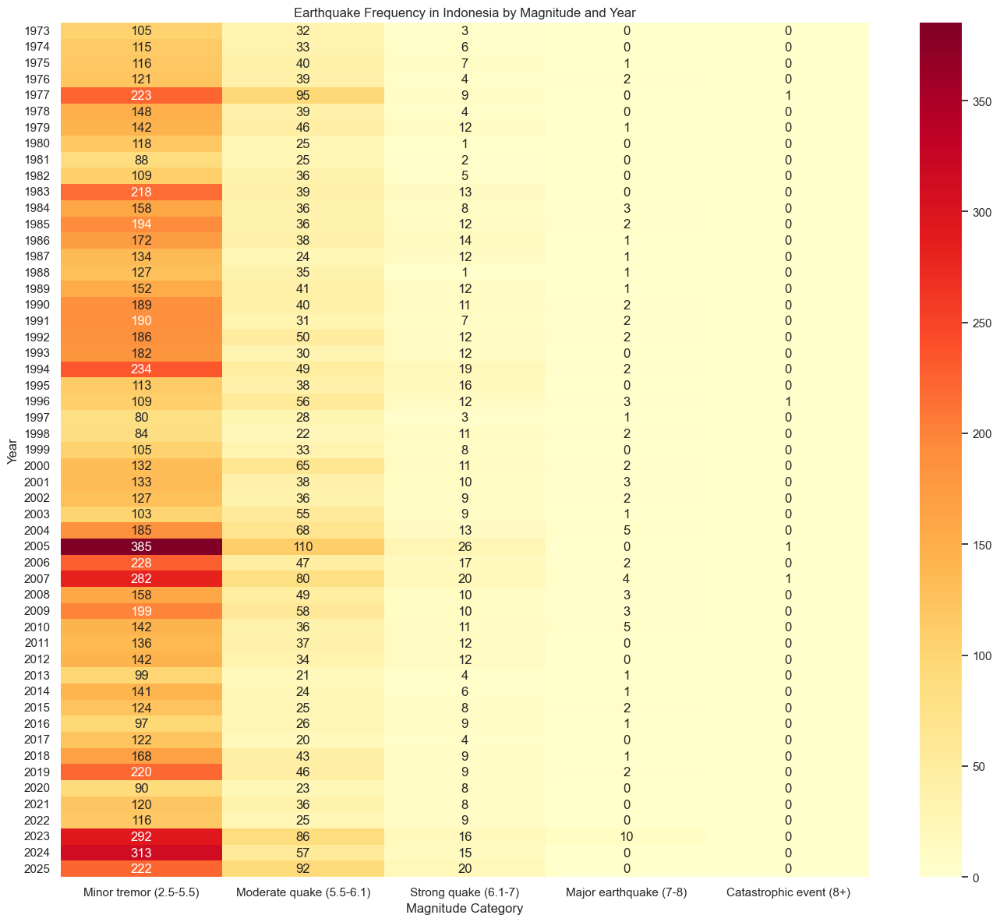

In [66]:
# Create heatmaps for each country SINCE 1973

for country in country_list:
    country_df = filtered_df[(filtered_df['Country'] == country) & (filtered_df['Year'] >= 1973)]
    
    # Create pivot table: rows = Year, columns = Magnitude, values = count
    heatmap_data = country_df.pivot_table(
        index='Year',
        columns='Magnitude',
        aggfunc='size',
        fill_value=0
    )

    # Reindex columns to match magnitude_order
    heatmap_data = heatmap_data.reindex(columns=magnitude_order).fillna(0).astype(int)

    # Remove column total labeled 'All' if it exists
    heatmap_data = heatmap_data.loc[:, heatmap_data.columns != 'All']

    # Plot heatmap
    plt.figure(figsize=(14, 12))
    sns.heatmap(heatmap_data, annot=True, fmt='d', cmap='YlOrRd')
    
    plt.title(f"Earthquake Frequency in {country} by Magnitude and Year")
    plt.ylabel("Year")
    plt.xlabel("Magnitude Category")
    plt.tight_layout()
    plt.show()

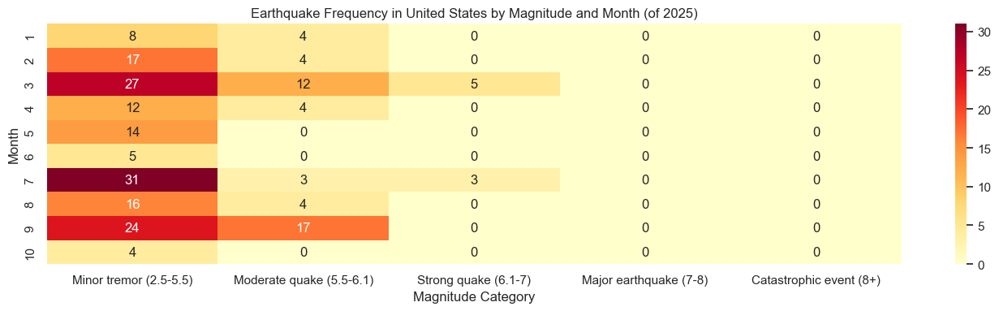

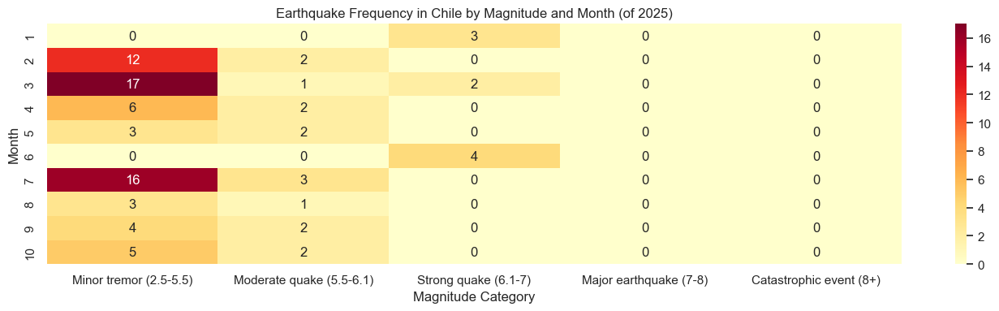

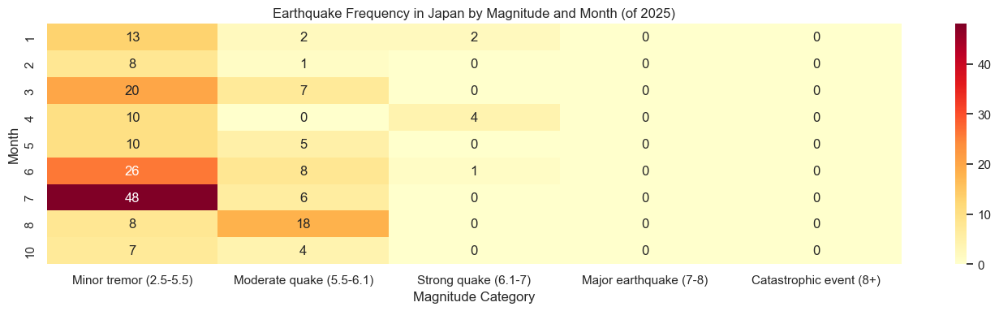

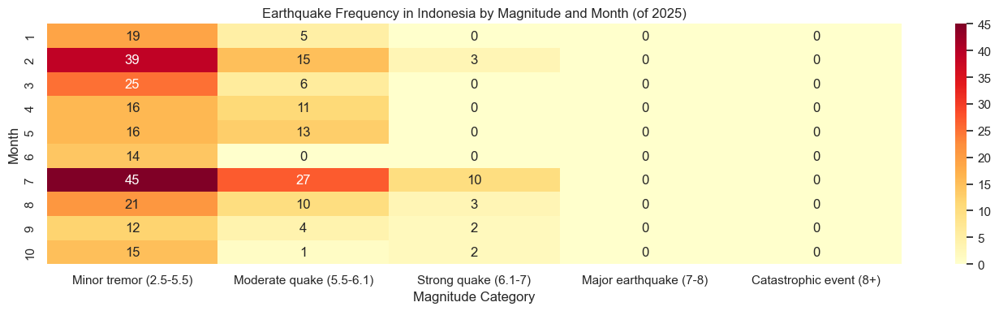

In [67]:
# Create heatmaps with LAST YEAR (2025) earthquakes for each country

for country in country_list:
    country_df = filtered_df[(filtered_df['Country'] == country) & (filtered_df['Year'] == 2025)]
    
    # Create pivot table: rows = Year, columns = Magnitude, values = count
    heatmap_data = country_df.pivot_table(
        index='Month',
        columns='Magnitude',
        aggfunc='size',
        fill_value=0
    )

    # Reindex columns to match magnitude_order
    heatmap_data = heatmap_data.reindex(columns=magnitude_order).fillna(0).astype(int)

    # Remove column total labeled 'All' if it exists
    heatmap_data = heatmap_data.loc[:, heatmap_data.columns != 'All']

    # Plot heatmap
    plt.figure(figsize=(14, 4))
    sns.heatmap(heatmap_data, annot=True, fmt='d', cmap='YlOrRd')
    
    plt.title(f"Earthquake Frequency in {country} by Magnitude and Month (of 2025)")
    plt.ylabel("Month")
    plt.xlabel("Magnitude Category")
    plt.tight_layout()
    plt.show()

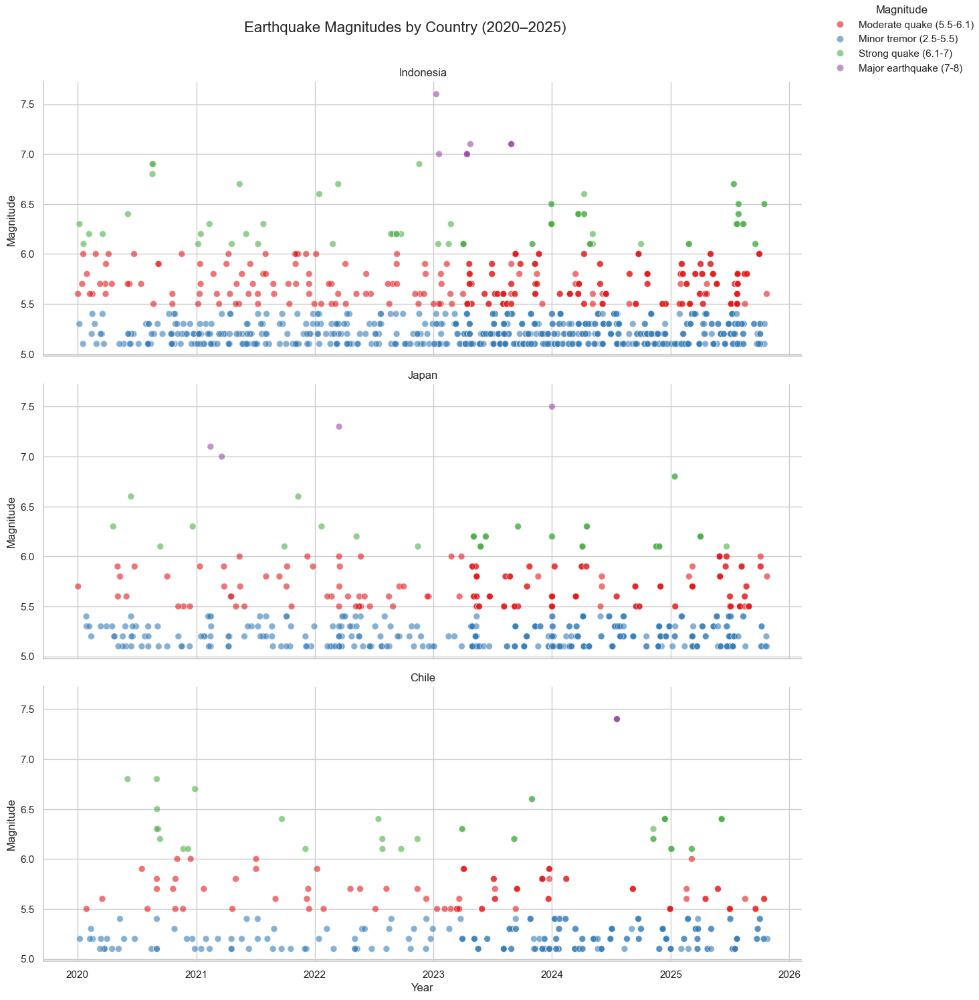

In [68]:
# Filter for selected countries
country_list = ['Chile', 'Japan', 'Indonesia']

mag_threshold = 5.1

# Filter data for selected countries and years
filtered_df = df[(df['Country'].isin(country_list)) & (df['Year'] >= 2020) & (df['Mag'] >= mag_threshold)]

# Set plot style
sns.set(style="whitegrid")

# Create timeline plots in a 1-column grid
g = sns.relplot(
    data=filtered_df,
    x="Time",
    y="Mag",
    hue="Magnitude",
    kind="scatter",
    col="Country",
    col_wrap=1,           # 1-column layout
    height=5,
    aspect=2,
    palette="Set1",       # or use 'husl', 'coolwarm', etc.
    alpha=0.6,
    s=50
)

# Customize titles and layout
g.set_titles("{col_name}")
g.set_axis_labels("Year", "Magnitude")
g.fig.suptitle("Earthquake Magnitudes by Country (2020–2025)", fontsize=16)
g.fig.tight_layout()
g.fig.subplots_adjust(top=0.92)  # Adjust for title spacing

# Move legend to top right outside the grid
g.legend.set_bbox_to_anchor((1.0, 1))
g.legend._set_loc(2) # Matplotlib code for 'upper left'(!?) is 2, but this is a private method.
        
plt.show()

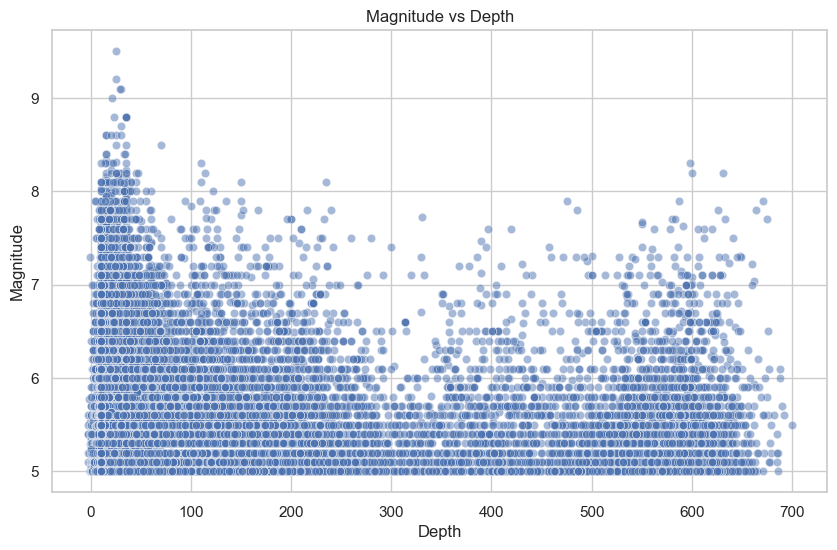

In [69]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Depth', y='Mag', data=df, alpha=0.5)
plt.title('Magnitude vs Depth')
plt.xlabel('Depth')
plt.ylabel('Magnitude')
plt.show()

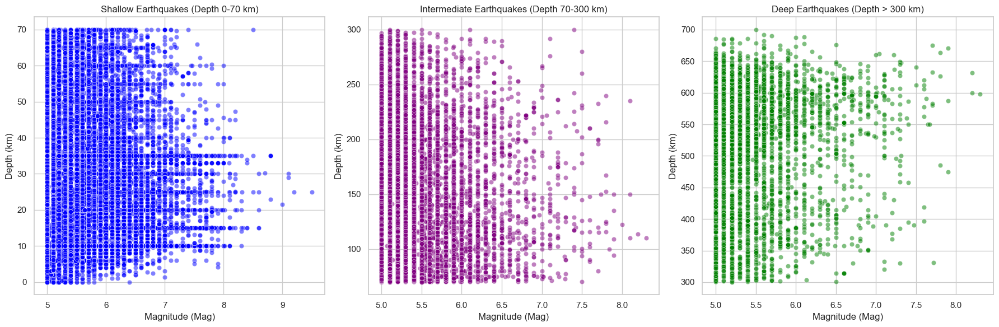

In [70]:
#shallow earthquake
shallow_eq = df[(df['Depth'] >= 0) & (df['Depth'] <= 70)]

# intermediate earthquakes (Depth 70-300 km)
intermediate_eq = df[(df['Depth'] > 70) & (df['Depth'] <= 300)]

# deep earthquakes (Depth more than 300 km)
deep_eq = df[df['Depth'] > 300]

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
sns.scatterplot(x='Mag', y='Depth', data=shallow_eq, color='blue', alpha=0.5)
plt.xlabel('Magnitude (Mag)')
plt.ylabel('Depth (km)')
plt.title('Shallow Earthquakes (Depth 0-70 km)')

plt.subplot(1, 3, 2)
sns.scatterplot(x='Mag', y='Depth', data=intermediate_eq, color='purple', alpha=0.5)
plt.xlabel('Magnitude (Mag)')
plt.ylabel('Depth (km)')
plt.title('Intermediate Earthquakes (Depth 70-300 km)')

plt.subplot(1, 3, 3)
sns.scatterplot(x='Mag', y='Depth', data=deep_eq, color='green', alpha=0.5)
plt.xlabel('Magnitude (Mag)')
plt.ylabel('Depth (km)')
plt.title('Deep Earthquakes (Depth > 300 km)')

plt.tight_layout()
plt.show()

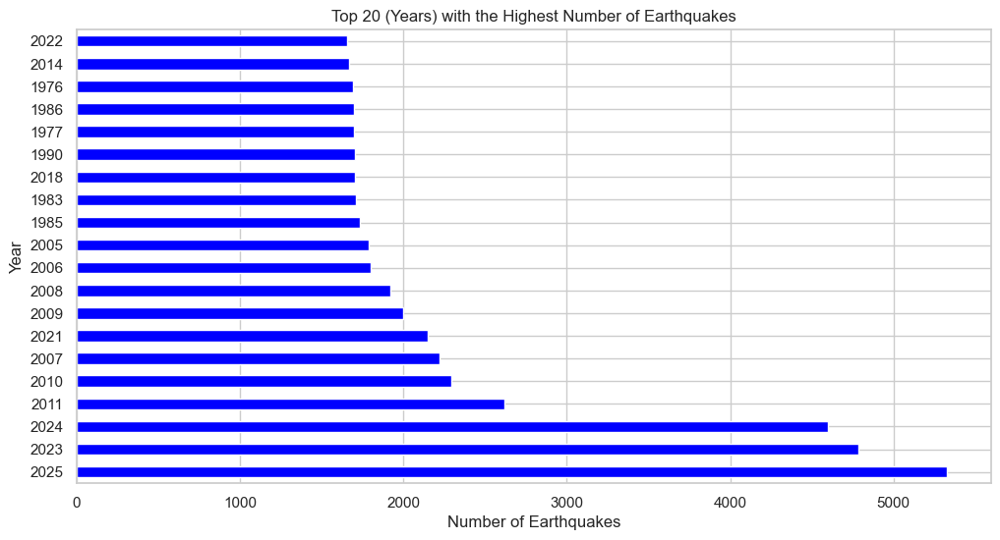

Year with the highest number of earthquakes: 2025
Highest number of earthquakes: 5329


In [71]:
earthquakes_per_year = df.groupby('Year').size()

top_10_years = earthquakes_per_year.nlargest(20)
year_with_most_earthquakes = top_10_years.idxmax()
highest_number_of_earthquakes = top_10_years.max()

plt.figure(figsize=(12, 6))
top_10_years.plot(kind='barh', color='blue')  
plt.title('Top 20 (Years) with the Highest Number of Earthquakes')
plt.xlabel('Number of Earthquakes')
plt.ylabel('Year')
plt.show()

print(f"Year with the highest number of earthquakes: {year_with_most_earthquakes}")
print(f"Highest number of earthquakes: {highest_number_of_earthquakes}")

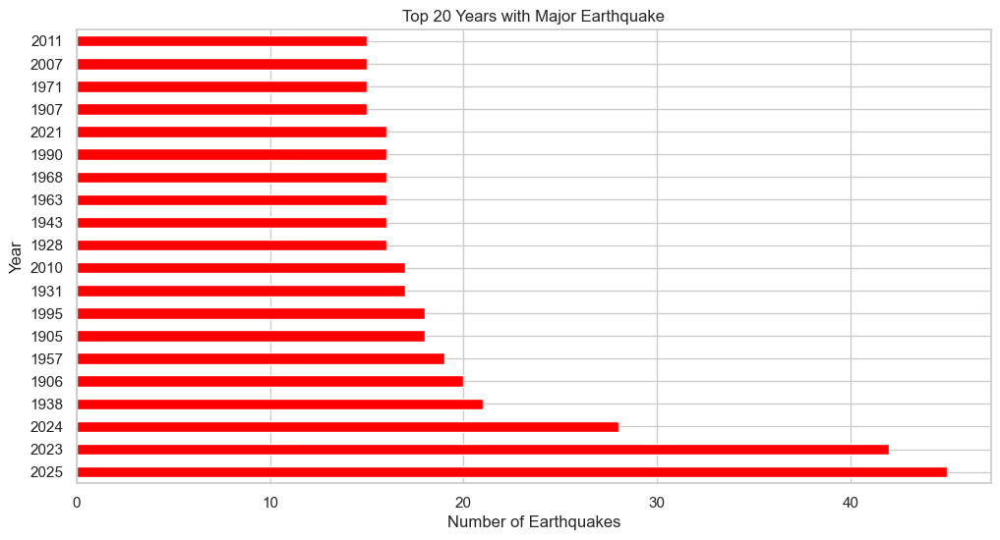

Year with the highest number of earthquakes (Mag > 7): 2025
Highest number of earthquakes with magnitude above 7: 45


In [72]:
high_magnitude_df = df[df['Mag'] > 7]

high_mag_earthquakes_per_year = high_magnitude_df.groupby('Year').size()

top_10_years_high_mag = high_mag_earthquakes_per_year.nlargest(20)

year_with_most_high_mag_earthquakes = top_10_years_high_mag.idxmax()
highest_number_of_high_mag_earthquakes = top_10_years_high_mag.max()

plt.figure(figsize=(12, 6))
top_10_years_high_mag.plot(kind='barh', color='red')  # Using barh to create a horizontal bar plot
plt.title('Top 20 Years with Major Earthquake')
plt.xlabel('Number of Earthquakes')
plt.ylabel('Year')
plt.show()

print(f"Year with the highest number of earthquakes (Mag > 7): {year_with_most_high_mag_earthquakes}")
print(f"Highest number of earthquakes with magnitude above 7: {highest_number_of_high_mag_earthquakes}")

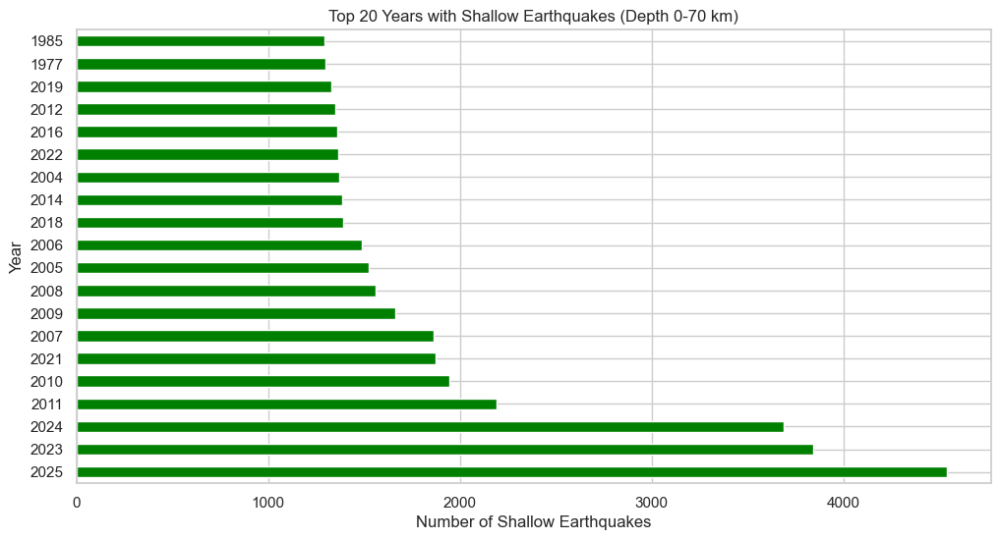

Year with the highest number of shallow earthquakes (Depth 0-70 km): 2025
Highest number of shallow earthquakes (Depth 0-70 km): 4543


In [73]:
shallow_eq_df = df[(df['Depth'] >= 0) & (df['Depth'] <= 70)]

shallow_eq_per_year = shallow_eq_df.groupby('Year').size()

top_20_years_shallow_eq = shallow_eq_per_year.nlargest(20)

year_with_most_shallow_eq = top_20_years_shallow_eq.idxmax()
highest_number_of_shallow_eq = top_20_years_shallow_eq.max()

plt.figure(figsize=(12, 6))
top_20_years_shallow_eq.plot(kind='barh', color='green')  
plt.title('Top 20 Years with Shallow Earthquakes (Depth 0-70 km)')
plt.xlabel('Number of Shallow Earthquakes')
plt.ylabel('Year')
plt.show()

print(f"Year with the highest number of shallow earthquakes (Depth 0-70 km): {year_with_most_shallow_eq}")
print(f"Highest number of shallow earthquakes (Depth 0-70 km): {highest_number_of_shallow_eq}")

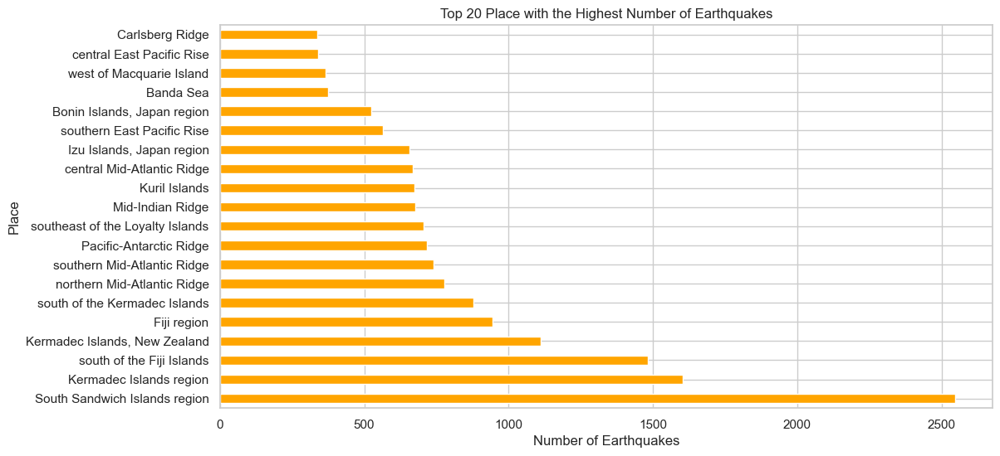

Year with the highest number of earthquakes: South Sandwich Islands region
Highest number of earthquakes: 2548


In [74]:
earthquakes_per_year = df.groupby('Place').size()

top_10_years = earthquakes_per_year.nlargest(20)

year_with_most_earthquakes = top_10_years.idxmax()
highest_number_of_earthquakes = top_10_years.max()


plt.figure(figsize=(12, 6))
top_10_years.plot(kind='barh', color='orange')  
plt.title('Top 20 Place with the Highest Number of Earthquakes')
plt.xlabel('Number of Earthquakes')
plt.ylabel('Place')
plt.show()

print(f"Year with the highest number of earthquakes: {year_with_most_earthquakes}")
print(f"Highest number of earthquakes: {highest_number_of_earthquakes}")

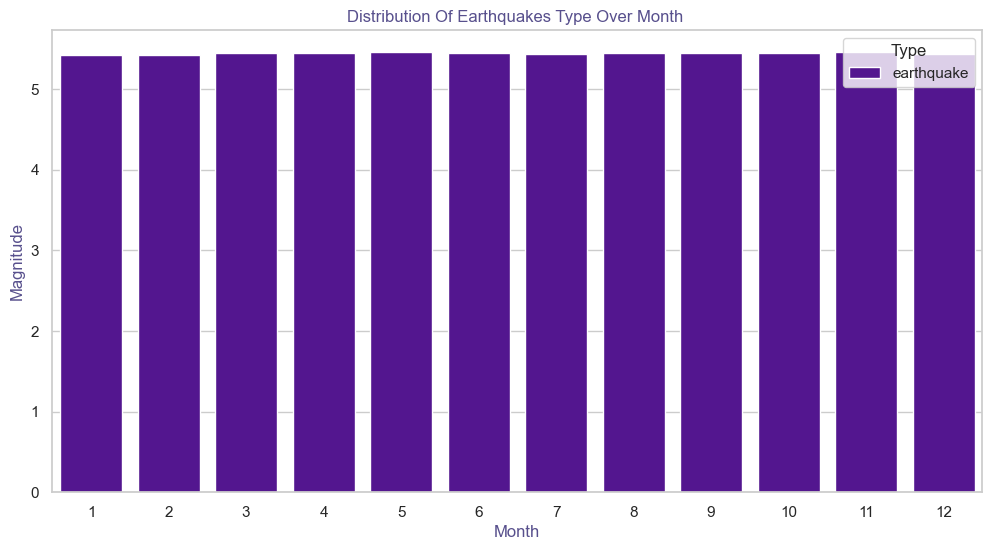

In [75]:
plt.figure(figsize=(12, 6))

set3_palette = sns.color_palette("plasma")

Days_of_week = sns.barplot(x=df['Month'], y="Mag", data=df, ci=None, hue="Type", palette=set3_palette)

Days_of_week.set_title("Distribution Of Earthquakes Type Over Month ", color="#58508d")
Days_of_week.set_ylabel("Magnitude", color="#58508d")
Days_of_week.set_xlabel("Month", color="#58508d")

plt.show()

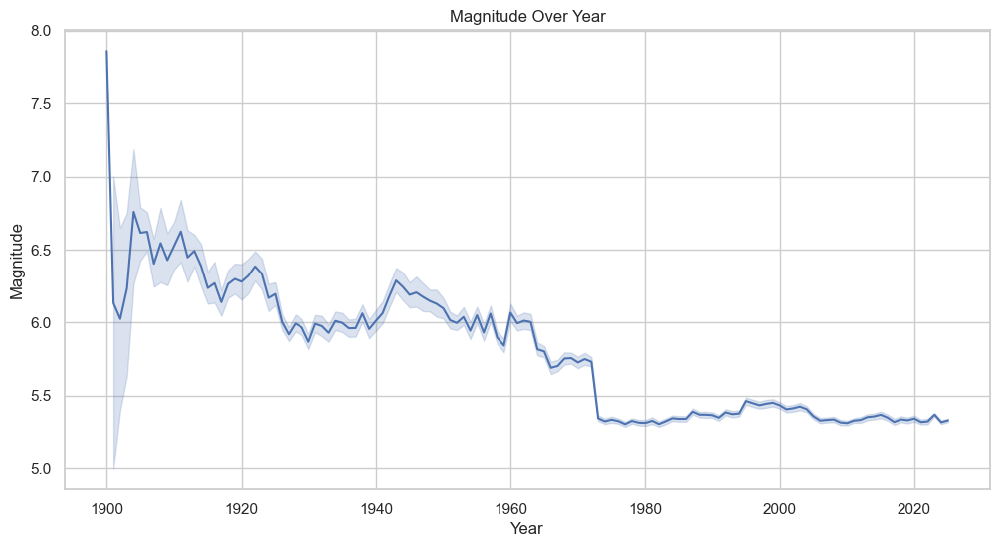

In [76]:
plt.figure(figsize=(12, 6))
sns.lineplot(x='Year', y='Mag', data=df)
plt.title('Magnitude Over Year')
plt.xlabel('Year')
plt.ylabel('Magnitude')
plt.show()

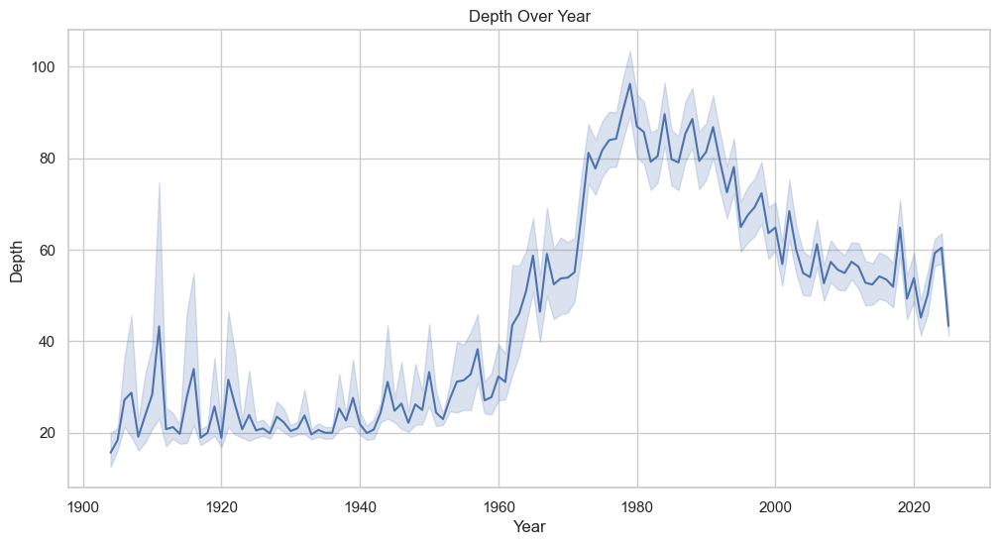

In [77]:
plt.figure(figsize=(12, 6))
sns.lineplot(x='Year', y='Depth', data=df)
plt.title('Depth Over Year')
plt.xlabel('Year')
plt.ylabel('Depth')
plt.show()

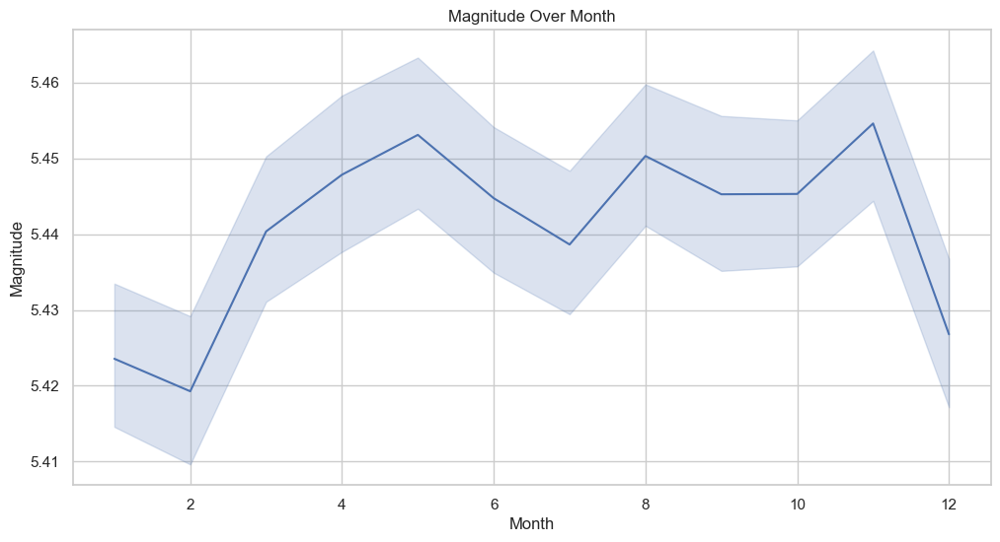

In [78]:
plt.figure(figsize=(12, 6))
sns.lineplot(x='Month', y='Mag', data=df)
plt.title('Magnitude Over Month')
plt.xlabel('Month')
plt.ylabel('Magnitude')
plt.show()

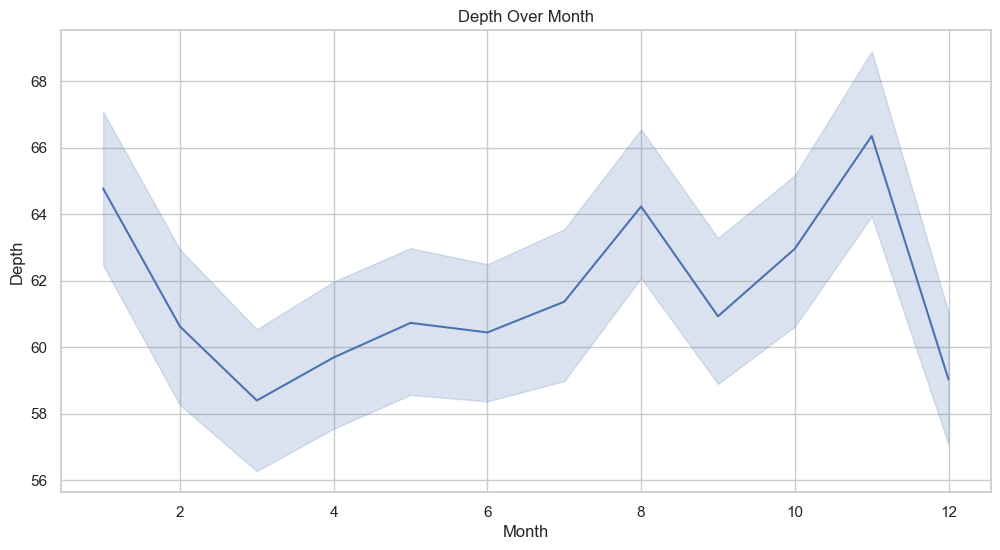

In [79]:
plt.figure(figsize=(12, 6))
sns.lineplot(x='Month', y='Depth', data=df)
plt.title('Depth Over Month')
plt.xlabel('Month')
plt.ylabel('Depth')
plt.show()

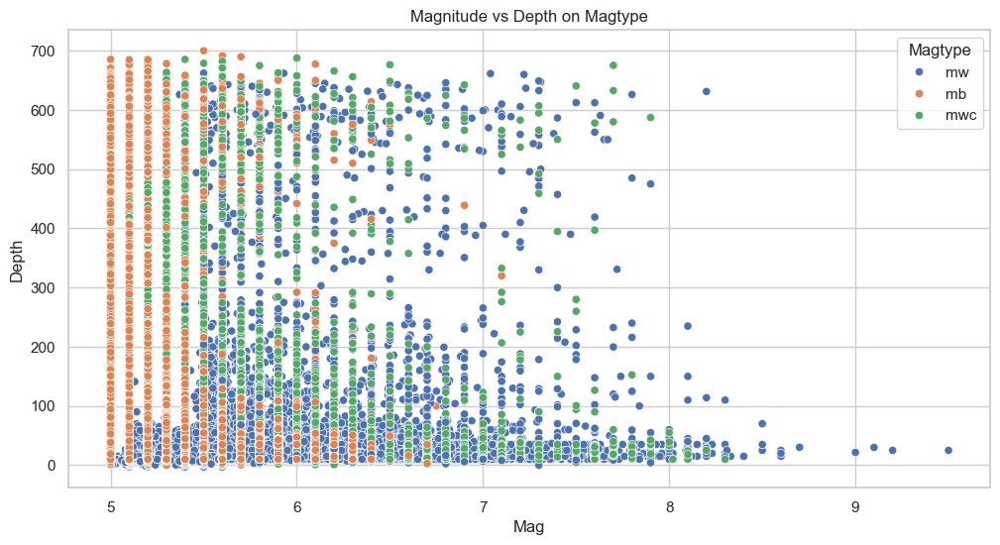

In [80]:
selected_categories = ['mb', 'mw','mwc']
df_selected = df[df['Magtype'].isin(selected_categories)]

plt.figure(figsize=(12, 6))
plt.title("Magnitude vs Depth on Magtype")
sns.scatterplot(x='Mag', y='Depth', hue='Magtype', data=df_selected)

plt.show()


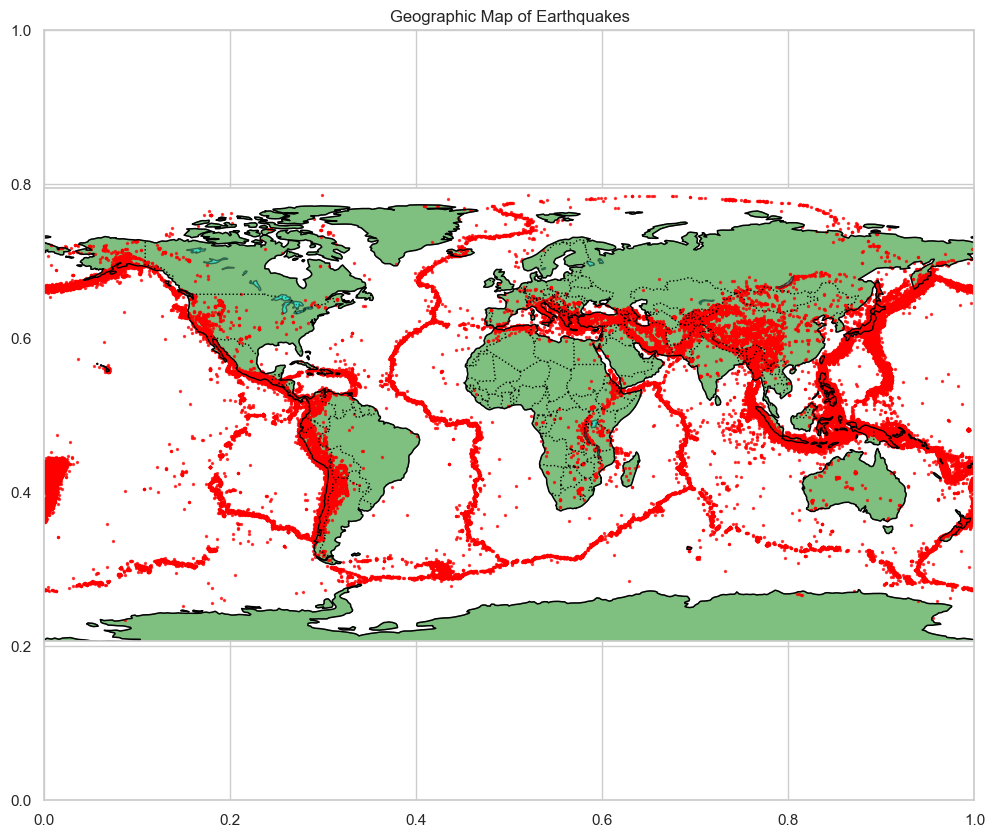

In [81]:
fig, ax = plt.subplots(figsize=(12, 10))
ax.set_title("Geographic Map of Earthquakes")

ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='green', alpha=0.5)
ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='aqua', alpha=0.5)

# Plotting the data points
ax.scatter(df["Longitude"], df["Latitude"], s=2, color='red', alpha=0.7)

plt.show()

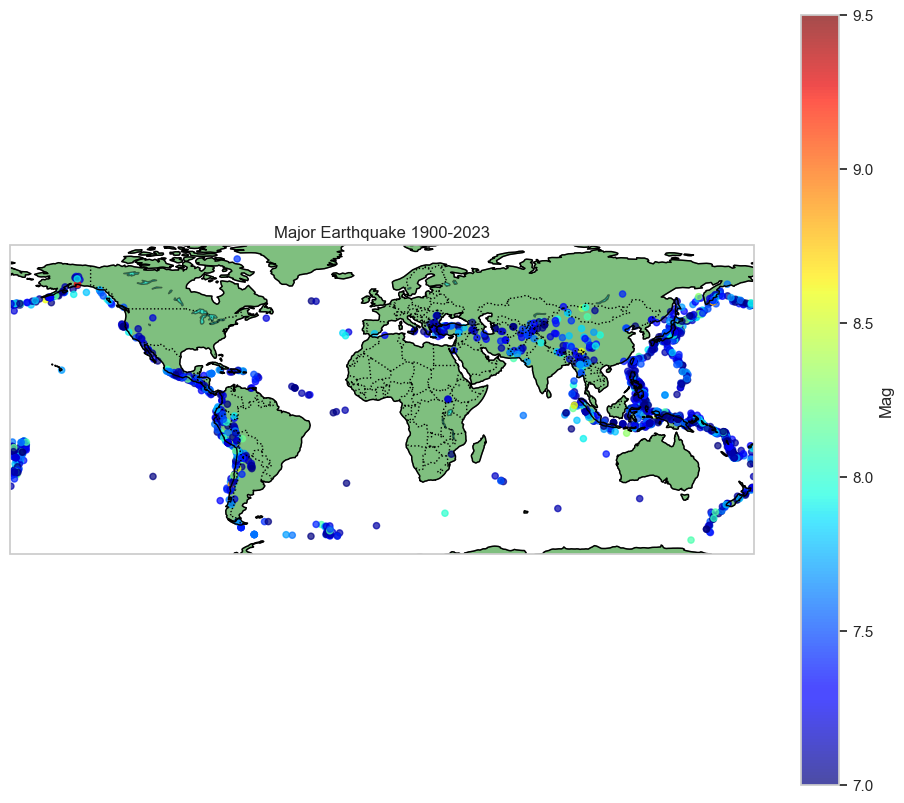

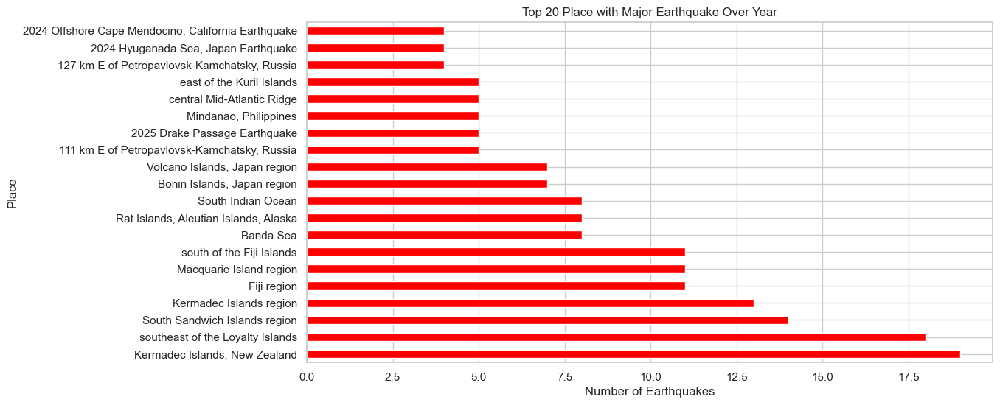

Year with the highest number of earthquakes (Mag > 7): Kermadec Islands, New Zealand
Highest number of earthquakes with magnitude above 7: 19


In [82]:
high_magnitude_df = df[df['Mag'] >=7]

fig, ax = plt.subplots(figsize=(12, 10), subplot_kw={'projection': ccrs.PlateCarree()})
ax.set_title("Major Earthquake 1900-2023")

ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='green', alpha=0.5)
ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='aqua', alpha=0.5)

sc = ax.scatter(high_magnitude_df["Longitude"], high_magnitude_df["Latitude"], s=20, c=high_magnitude_df["Mag"], cmap='jet', alpha=0.7)

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.05, label='Mag')

plt.show()

#Barchart
high_mag_earthquakes_per_year = high_magnitude_df.groupby('Place').size()

top_10_years_high_mag = high_mag_earthquakes_per_year.nlargest(20)

year_with_most_high_mag_earthquakes = top_10_years_high_mag.idxmax()
highest_number_of_high_mag_earthquakes = top_10_years_high_mag.max()

plt.figure(figsize=(12, 6))
top_10_years_high_mag.plot(kind='barh', color='red')  
plt.title('Top 20 Place with Major Earthquake Over Year')
plt.xlabel('Number of Earthquakes')
plt.ylabel('Place')
plt.show()

print(f"Year with the highest number of earthquakes (Mag > 7): {year_with_most_high_mag_earthquakes}")
print(f"Highest number of earthquakes with magnitude above 7: {highest_number_of_high_mag_earthquakes}")

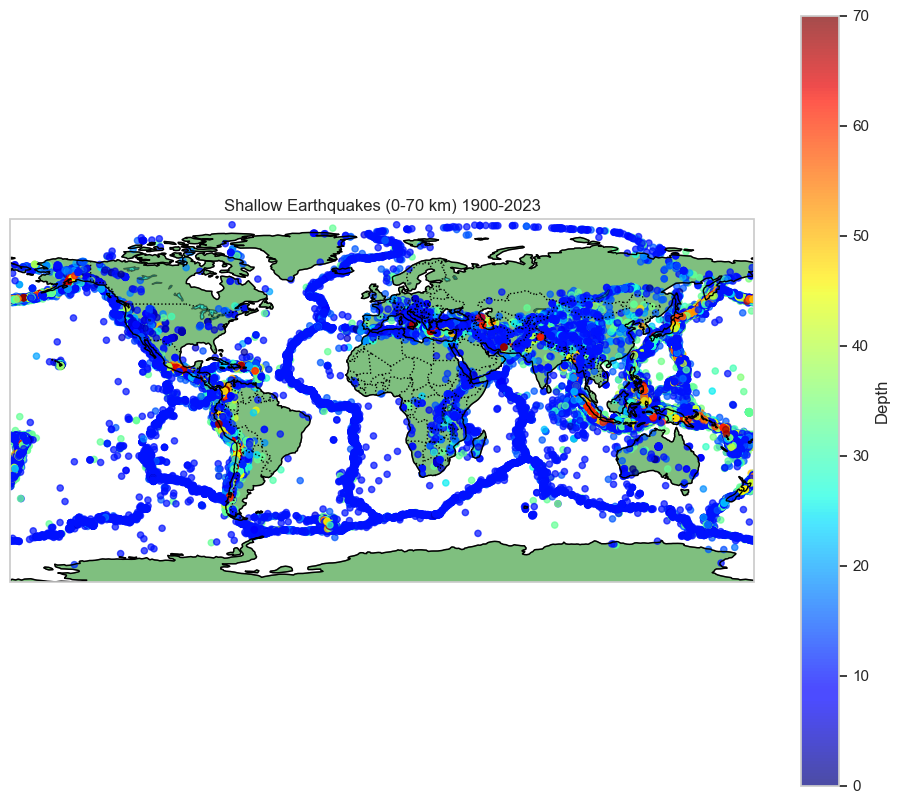

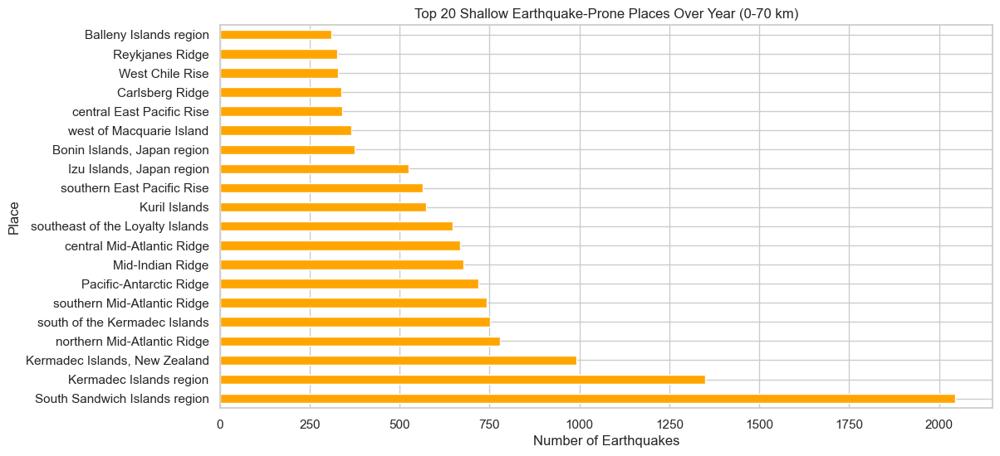

Place with the highest number of shallow earthquakes (Depth 0-70 km): South Sandwich Islands region
Highest number of shallow earthquakes (Depth 0-70 km): 2046


In [83]:
shallow_depth_df = df[(df['Depth'] >= 0) & (df['Depth'] <= 70)]

fig, ax = plt.subplots(figsize=(12,10), subplot_kw={'projection': ccrs.PlateCarree()})
ax.set_title("Shallow Earthquakes (0-70 km) 1900-2023")

ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='green', alpha=0.5)
ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='aqua', alpha=0.5)

sc = ax.scatter(shallow_depth_df["Longitude"], shallow_depth_df["Latitude"], s=20, c=shallow_depth_df["Depth"], cmap='jet', alpha=0.7)

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.05, label='Depth')

plt.show()

# Bar chart
shallow_earthquakes_per_place = shallow_depth_df.groupby('Place').size()

top_20_shallow_places = shallow_earthquakes_per_place.nlargest(20)

shallow_place_with_most_earthquakes = top_20_shallow_places.idxmax()
shallow_highest_number_of_earthquakes = top_20_shallow_places.max()

plt.figure(figsize=(12, 6))
top_20_shallow_places.plot(kind='barh', color='orange')  
plt.title('Top 20 Shallow Earthquake-Prone Places Over Year (0-70 km)')
plt.xlabel('Number of Earthquakes')
plt.ylabel('Place')
plt.show()

print(f"Place with the highest number of shallow earthquakes (Depth 0-70 km): {shallow_place_with_most_earthquakes}")
print(f"Highest number of shallow earthquakes (Depth 0-70 km): {shallow_highest_number_of_earthquakes}")

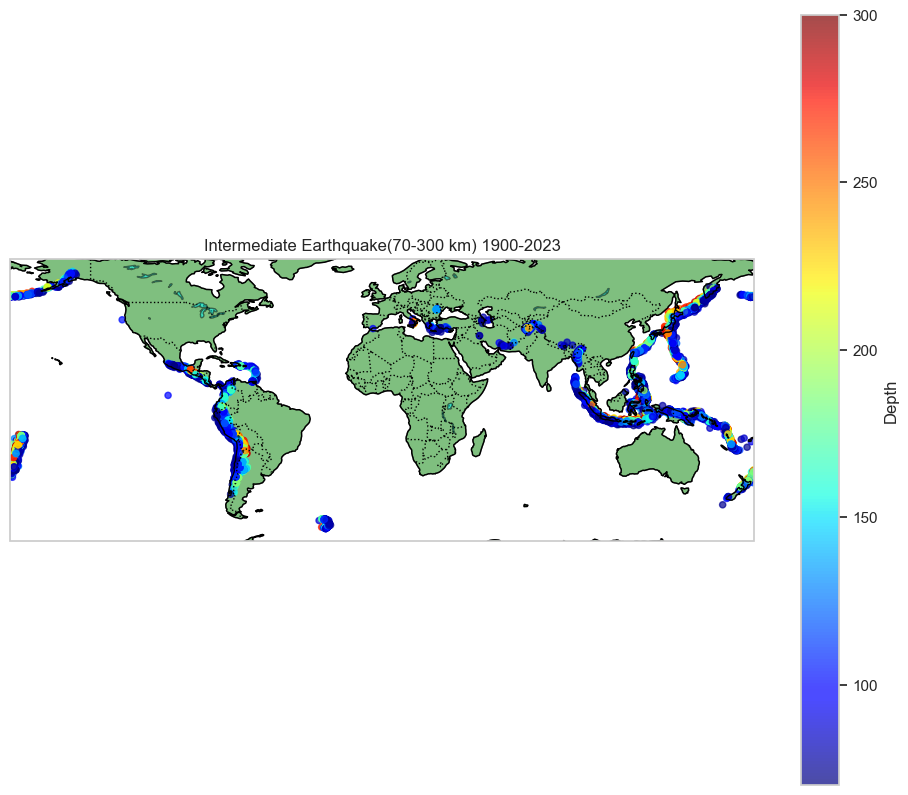

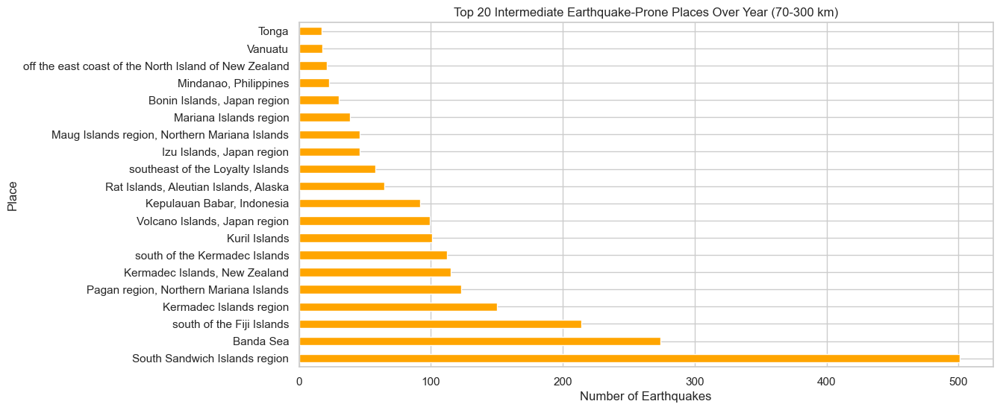

Place with the highest number of Intermediate Earthquake  (Depth 70-300 km): South Sandwich Islands region
Highest number of Intermediate Earthquake  (Depth 70-300 km): 2046


In [84]:
intermediate_depth_df = df[(df['Depth'] > 70) & (df['Depth'] <= 300)]

fig, ax = plt.subplots(figsize=(12,10), subplot_kw={'projection': ccrs.PlateCarree()})
ax.set_title("Intermediate Earthquake(70-300 km) 1900-2023")

ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='green', alpha=0.5)
ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='aqua', alpha=0.5)

sc = ax.scatter(intermediate_depth_df["Longitude"], intermediate_depth_df["Latitude"], s=20, c=intermediate_depth_df["Depth"], cmap='jet', alpha=0.7)

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.05, label='Depth')

plt.show()

# Bar chart
intermediate_earthquakes_per_place = intermediate_depth_df.groupby('Place').size()

top_20_intermediate_places = intermediate_earthquakes_per_place.nlargest(20)

intermediate_place_with_most_earthquakes = top_20_intermediate_places.idxmax()
intermediate_highest_number_of_earthquakes = top_20_intermediate_places.max()

plt.figure(figsize=(12, 6))
top_20_intermediate_places.plot(kind='barh', color='orange')  
plt.title('Top 20 Intermediate Earthquake-Prone Places Over Year (70-300 km)')
plt.xlabel('Number of Earthquakes')
plt.ylabel('Place')
plt.show()

print(f"Place with the highest number of Intermediate Earthquake  (Depth 70-300 km): {shallow_place_with_most_earthquakes}")
print(f"Highest number of Intermediate Earthquake  (Depth 70-300 km): {shallow_highest_number_of_earthquakes}")

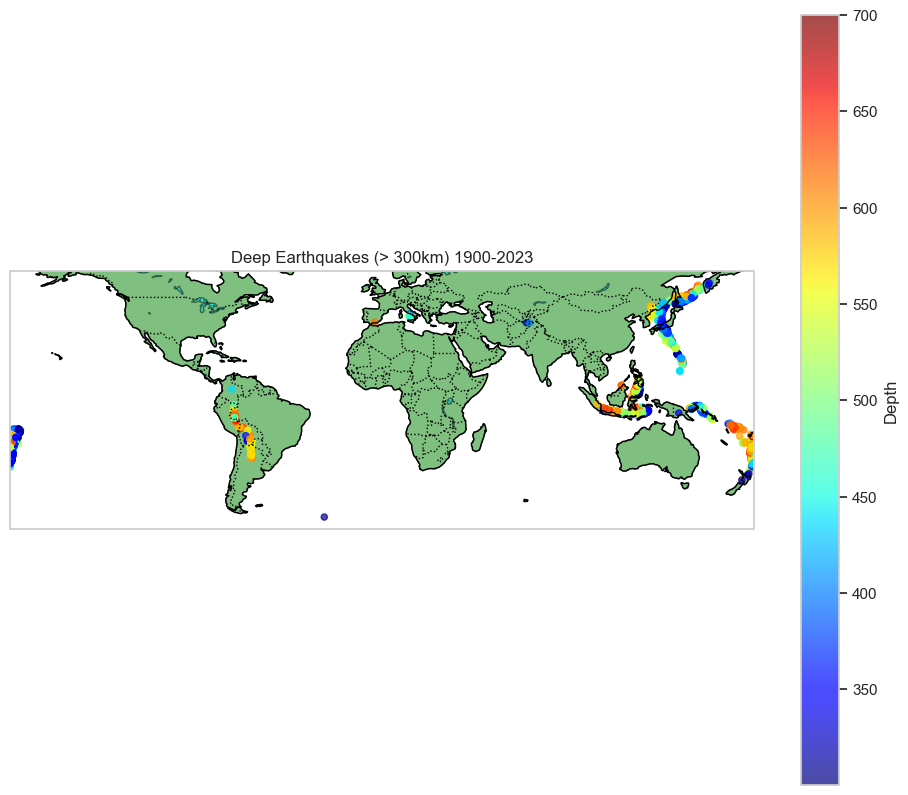

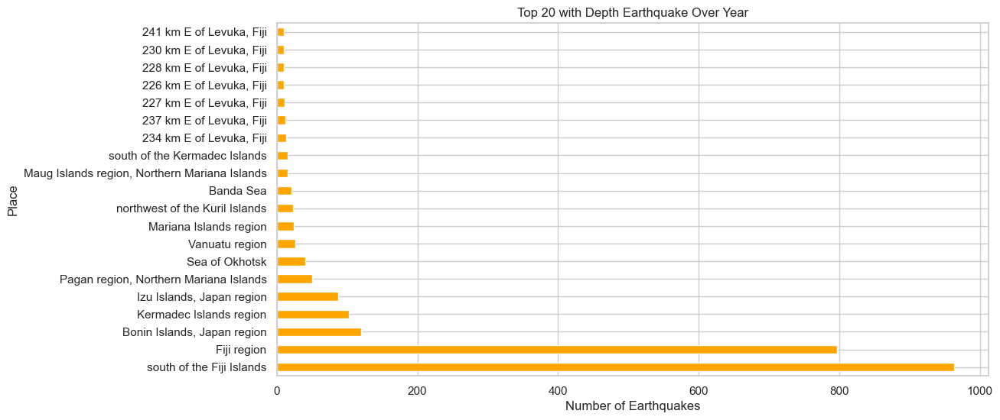

Place with the highest number of earthquakes (Depth > 300km): south of the Fiji Islands
Highest number of earthquakes (Depth > 300km): 964


In [85]:
depth_magnitude_df = df[df['Depth'] >300]

fig, ax = plt.subplots(figsize=(12,10), subplot_kw={'projection': ccrs.PlateCarree()})
ax.set_title("Deep Earthquakes (> 300km) 1900-2023")

ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.add_feature(cfeature.LAND, edgecolor='black', facecolor='green', alpha=0.5)
ax.add_feature(cfeature.LAKES, edgecolor='black', facecolor='aqua', alpha=0.5)

sc = ax.scatter(depth_magnitude_df["Longitude"], depth_magnitude_df["Latitude"], s=20, c=depth_magnitude_df["Depth"], cmap='jet', alpha=0.7)

cbar = plt.colorbar(sc, ax=ax, orientation='vertical', pad=0.05, label='Depth')

plt.show()

#Barchart
high_depth_df = df[df['Depth'] > 300]

earthquakes_per_place = high_depth_df.groupby('Place').size()

top_20_places = earthquakes_per_place.nlargest(20)

place_with_most_earthquakes = top_20_places.idxmax()
highest_number_of_earthquakes = top_20_places.max()

plt.figure(figsize=(12, 6))
top_20_places.plot(kind='barh', color='orange')  
plt.title('Top 20 with Depth Earthquake Over Year')
plt.xlabel('Number of Earthquakes')
plt.ylabel('Place')
plt.show()

print(f"Place with the highest number of earthquakes (Depth > 300km): {place_with_most_earthquakes}")
print(f"Highest number of earthquakes (Depth > 300km): {highest_number_of_earthquakes}")

In [ ]:
fig = px.scatter_geo(df, 
                     lon='Longitude', 
                     lat='Latitude', 
                     color='Type',
                     size='Mag',
                     hover_name='Place',
                     animation_frame='Year',
                     projection='natural earth',
                     title='Earthquake Animation')

fig.update_geos(
    showcoastlines=True, coastlinecolor="Black",
    showland=True, landcolor="rgb(217, 217, 217)",
    showocean=True, oceancolor="rgb(144, 202, 249)",
    showcountries=True, countrycolor="rgb(5, 5, 5)"
)

fig.update_layout(
    height=800,  
    width= 800   
)

fig.show(renderer="browser")